# TeaBD-HybridNet **v2**: Fully-Pretrained CNN-ViT Hybrid for teaLeafBD

**Dataset:** teaLeafBD (5,276 images, 7 classes)  


## 1. Setup & Imports

In [1]:
import torch
torch.cuda.empty_cache()
print(f"Free: {torch.cuda.mem_get_info()[0]/1e9:.1f} GB / {torch.cuda.mem_get_info()[1]/1e9:.1f} GB")

Free: 7.7 GB / 8.2 GB


In [2]:
import os, sys, csv, random, json, time, copy
from pathlib import Path
from collections import defaultdict

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

import torchvision.transforms as T
from PIL import Image

from sklearn.metrics import (accuracy_score, f1_score, precision_score,
                              recall_score, confusion_matrix, classification_report)

import pandas as pd
import timm
import matplotlib.pyplot as plt
import seaborn as sns
# ---- New imports for MambaVision (add this cell right after Cell 0) ----
from mambavision import create_model as create_mambavision_model

def build_mambavision(num_classes=None, pretrained=True):
    model = create_mambavision_model('mamba_vision_T', pretrained=pretrained, num_classes=num_classes)
    return model.to(device)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if device.type == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")


/home/nafim/anaconda3/envs/tealeaf/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/nafim/anaconda3/envs/tealeaf/lib/python3.10/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/home/nafim/anaconda3/envs/tealeaf/lib/python3.10/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


Using device: cuda
GPU: NVIDIA GeForce RTX 3050
VRAM: 8.2 GB


## 2. Configuration

In [3]:
# ---- UPDATE THIS PATH TO MATCH YOUR MACHINE ----
DATASET_ROOT = "/mnt/f415dcc8-27a5-4e66-8493-25f1d939974c/An Indivisual Research/teaLeafBD/newdataset/teaLeafBD"
SPLITS_DIR = "./data/splits"
CHECKPOINT_DIR = "./checkpoints"
RESULTS_DIR = "./results"
FIGURES_DIR = f"{RESULTS_DIR}/figures"
TABLES_DIR = f"{RESULTS_DIR}/tables"
HISTORY_DIR = f"{RESULTS_DIR}/history"
XAI_DIR = f"{RESULTS_DIR}/xai"
ROBUSTNESS_DIR = f"{RESULTS_DIR}/robustness"

for _d in [SPLITS_DIR, CHECKPOINT_DIR, RESULTS_DIR,
           FIGURES_DIR, TABLES_DIR, HISTORY_DIR, XAI_DIR, ROBUSTNESS_DIR]:
    os.makedirs(_d, exist_ok=True)

IMG_SIZE = 224
BATCH_SIZE = 16          # reduce to 16 if you hit CUDA OOM (RTX 3050 8GB)
NUM_EPOCHS = 100
LR = 1e-4
WEIGHT_DECAY = 0.05
EARLY_STOP_PATIENCE = 15
SEED = 42

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if device.type == "cuda":
    torch.cuda.manual_seed_all(SEED)

# Real dataset statistics (computed from your dataset_report.json)
TEALEAF_MEAN = [0.6979, 0.6996, 0.6627]
TEALEAF_STD  = [0.1672, 0.1541, 0.2068]

CLASS_MAP = {
    "1. Tea algal leaf spot": "algal_leaf_spot",
    "2. Brown Blight": "brown_blight",
    "3. Gray Blight": "gray_blight",
    "4. Helopeltis": "helopeltis",
    "5. Red spider": "red_spider",
    "6. Green mirid bug": "green_mirid_bug",
    "7. Healthy leaf": "healthy",
}
LABEL_LIST = ["algal_leaf_spot", "brown_blight", "gray_blight", "helopeltis",
              "red_spider", "green_mirid_bug", "healthy"]
LABEL_TO_IDX = {name: i for i, name in enumerate(LABEL_LIST)}
NUM_CLASSES = len(LABEL_LIST)

# Real class counts (from dataset_report.json)
CLASS_COUNTS = {
    "algal_leaf_spot": 418, "brown_blight": 506, "gray_blight": 1013,
    "helopeltis": 607, "red_spider": 515, "green_mirid_bug": 1282, "healthy": 935,
}
print("Config loaded. Classes:", LABEL_LIST)


Config loaded. Classes: ['algal_leaf_spot', 'brown_blight', 'gray_blight', 'helopeltis', 'red_spider', 'green_mirid_bug', 'healthy']


## 3. Data Preparation (Stratified Split)

Run this once. If `data/splits/train.csv` already exists, this cell will skip re-splitting.

In [4]:
def stratified_split(files, train_ratio=0.70, val_ratio=0.15, seed=SEED):
    rng = random.Random(seed)
    files = files.copy()
    rng.shuffle(files)
    n = len(files)
    n_train = int(n * train_ratio)
    n_val = int(n * val_ratio)
    return files[:n_train], files[n_train:n_train+n_val], files[n_train+n_val:]


def prepare_splits(root, out_dir, force=False):
    train_csv = Path(out_dir) / "train.csv"
    if train_csv.exists() and not force:
        print(f"[SKIP] Splits already exist at {out_dir}. Set force=True to regenerate.")
        return

    root = Path(root)
    all_rows = {"train": [], "val": [], "test": []}
    class_counts = defaultdict(lambda: {"train": 0, "val": 0, "test": 0})

    for folder_name, short_label in CLASS_MAP.items():
        class_dir = root / folder_name
        if not class_dir.exists():
            print(f"[WARNING] Folder not found: {class_dir}")
            continue
        files = sorted([str(f) for f in class_dir.iterdir()
                         if f.suffix.lower() in [".jpg", ".jpeg", ".png"]])
        tr, va, te = stratified_split(files)
        label_idx = LABEL_TO_IDX[short_label]
        for f in tr: all_rows["train"].append((f, short_label, label_idx))
        for f in va: all_rows["val"].append((f, short_label, label_idx))
        for f in te: all_rows["test"].append((f, short_label, label_idx))
        class_counts[short_label] = {"train": len(tr), "val": len(va), "test": len(te)}
        print(f"{short_label:20s}: train={len(tr)}, val={len(va)}, test={len(te)}")

    rng = random.Random(SEED)
    for split_name, rows in all_rows.items():
        rng.shuffle(rows)
        out_path = Path(out_dir) / f"{split_name}.csv"
        with open(out_path, "w", newline="") as f:
            writer = csv.writer(f)
            writer.writerow(["filepath", "label", "label_idx"])
            writer.writerows(rows)
        print(f"[SAVED] {out_path} ({len(rows)} rows)")

    return class_counts


class_counts_split = prepare_splits(DATASET_ROOT, SPLITS_DIR)


[SKIP] Splits already exist at ./data/splits. Set force=True to regenerate.


## 4. Dataset Class & Transforms

In [5]:
class TeaLeafBDDataset(Dataset):
    def __init__(self, csv_path, transform=None):
        self.samples = []
        with open(csv_path, newline="") as f:
            reader = csv.DictReader(f)
            for row in reader:
                self.samples.append((row["filepath"], int(row["label_idx"]), row["label"]))
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        filepath, label_idx, label_name = self.samples[idx]
        image = Image.open(filepath).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label_idx

    def get_labels(self):
        return [s[1] for s in self.samples]


def get_train_transform(img_size=IMG_SIZE, use_randaugment=True):
    """
    use_randaugment=True adds torchvision's RandAugment (2 ops, magnitude 9 - the
    standard DeiT/ViT-from-scratch training recipe setting). ViTs trained from
    scratch on small datasets need substantially more aggressive augmentation
    than CNNs, since they lack convolutional inductive biases; RandAugment is
    the standard fix used in every from-scratch ViT training recipe (DeiT, etc).
    """
    transform_list = [
        T.RandomResizedCrop(img_size, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
        T.RandomHorizontalFlip(p=0.5),
        T.RandomVerticalFlip(p=0.2),
        T.RandomRotation(degrees=15),
        T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.02),
    ]
    if use_randaugment:
        transform_list.append(T.RandAugment(num_ops=2, magnitude=9))
    transform_list += [
        T.ToTensor(),
        T.RandomErasing(p=0.25, scale=(0.02, 0.15)),
        T.Normalize(mean=TEALEAF_MEAN, std=TEALEAF_STD),
    ]
    return T.Compose(transform_list)


def get_eval_transform(img_size=IMG_SIZE):
    return T.Compose([
        T.Resize(int(img_size * 1.14)),
        T.CenterCrop(img_size),
        T.ToTensor(),
        T.Normalize(mean=TEALEAF_MEAN, std=TEALEAF_STD),
    ])


def get_class_weights():
    counts = torch.tensor([CLASS_COUNTS[c] for c in LABEL_LIST], dtype=torch.float32)
    weights = 1.0 / counts
    weights = weights / weights.mean()
    return weights


train_ds = TeaLeafBDDataset(f"{SPLITS_DIR}/train.csv", transform=get_train_transform())
val_ds   = TeaLeafBDDataset(f"{SPLITS_DIR}/val.csv",   transform=get_eval_transform())
test_ds  = TeaLeafBDDataset(f"{SPLITS_DIR}/test.csv",  transform=get_eval_transform())

print(f"Train: {len(train_ds)} | Val: {len(val_ds)} | Test: {len(test_ds)}")

img, label = train_ds[0]
print(f"Sample tensor shape: {img.shape}, label: {label} ({LABEL_LIST[label]})")

class_weights = get_class_weights().to(device)
print("\nClass weights:", dict(zip(LABEL_LIST, class_weights.cpu().tolist())))


Train: 3691 | Val: 789 | Test: 798
Sample tensor shape: torch.Size([3, 224, 224]), label: 6 (healthy)

Class weights: {'algal_leaf_spot': 1.5513780117034912, 'brown_blight': 1.2815731763839722, 'gray_blight': 0.6401540637016296, 'helopeltis': 1.0683294534683228, 'red_spider': 1.2591767311096191, 'green_mirid_bug': 0.5058315396308899, 'healthy': 0.6935572624206543}


In [6]:
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                           num_workers=4, pin_memory=True, drop_last=True)
val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=4, pin_memory=True)
test_loader  = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=4, pin_memory=True)

print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")


Train batches: 230 | Val batches: 50 | Test batches: 50


## 5. Visualize Sample Images (sanity check)

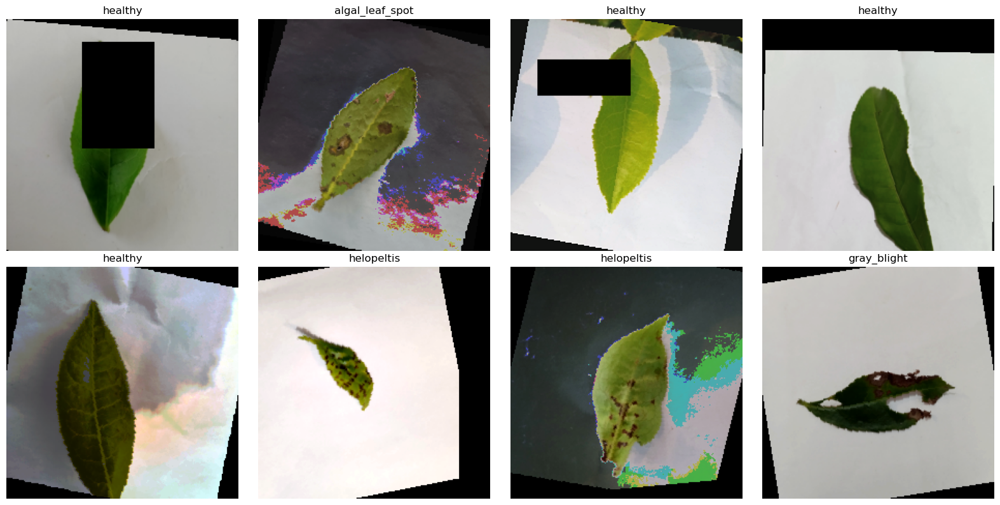

In [7]:
def denormalize(tensor, mean=TEALEAF_MEAN, std=TEALEAF_STD):
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return (tensor * std + mean).clamp(0, 1)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()
for i in range(8):
    img, label = train_ds[i]
    img_denorm = denormalize(img).permute(1, 2, 0).numpy()
    axes[i].imshow(img_denorm)
    axes[i].set_title(LABEL_LIST[label])
    axes[i].axis("off")
plt.tight_layout()
plt.savefig(f"{FIGURES_DIR}/sample_images.png", dpi=300, bbox_inches="tight")
plt.show()


## 6. Model: TeaBD-HybridNet

CNN branch (local features) + ViT branch (global features) fused via cross-attention.

In [8]:
# %% [markdown]
# ## 6. Model: TeaBD-HybridNet

# ============================================================
# Shared building blocks (also used by legacy/ablation variants if you keep them)
# ============================================================
class PatchEmbedding(nn.Module):
    def __init__(self, img_size=224, patch_size=16, in_channels=3, embed_dim=384):
        super().__init__()
        self.num_patches = (img_size // patch_size) ** 2
        self.proj = nn.Conv2d(in_channels, embed_dim, kernel_size=patch_size, stride=patch_size)
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches, embed_dim))
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

    def forward(self, x):
        x = self.proj(x)
        x = x.flatten(2).transpose(1, 2)
        x = x + self.pos_embed
        return x


class MultiHeadSelfAttention(nn.Module):
    def __init__(self, dim, heads=8, dropout=0.1):
        super().__init__()
        assert dim % heads == 0
        self.heads = heads
        self.head_dim = dim // heads
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(dim, dim * 3)
        self.proj = nn.Linear(dim, dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.heads, self.head_dim).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        attn = self.dropout(attn)
        out = (attn @ v).transpose(1, 2).reshape(B, N, C)
        return self.proj(out)


class DropPath(nn.Module):
    """Stochastic depth: randomly drops the residual branch during training."""
    def __init__(self, drop_prob=0.0):
        super().__init__()
        self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training:
            return x
        keep_prob = 1 - self.drop_prob
        shape = (x.shape[0],) + (1,) * (x.ndim - 1)
        random_tensor = keep_prob + torch.rand(shape, dtype=x.dtype, device=x.device)
        random_tensor.floor_()
        return x.div(keep_prob) * random_tensor


class TransformerBlock(nn.Module):
    """Transformer block with stochastic depth (drop_path)."""
    def __init__(self, dim=384, heads=6, mlp_ratio=4.0, dropout=0.1, drop_path=0.0):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = MultiHeadSelfAttention(dim, heads, dropout)
        self.drop_path1 = DropPath(drop_path)
        self.norm2 = nn.LayerNorm(dim)
        hidden_dim = int(dim * mlp_ratio)
        self.mlp = nn.Sequential(
            nn.Linear(dim, hidden_dim), nn.GELU(), nn.Dropout(dropout),
            nn.Linear(hidden_dim, dim), nn.Dropout(dropout),
        )
        self.drop_path2 = DropPath(drop_path)
    def forward(self, x):
        x = x + self.drop_path1(self.attn(self.norm1(x)))
        x = x + self.drop_path2(self.mlp(self.norm2(x)))
        return x


class CrossAttentionFusion(nn.Module):
    """f_cnn as Query, f_vit as Key/Value. Only used when use_fusion=True."""
    def __init__(self, dim=384, heads=6, dropout=0.1):
        super().__init__()
        self.norm_q = nn.LayerNorm(dim)
        self.norm_kv = nn.LayerNorm(dim)
        self.mhsa = nn.MultiheadAttention(dim, heads, dropout=dropout, batch_first=True)
        self.norm_out = nn.LayerNorm(dim)
        self.ffn = nn.Sequential(
            nn.Linear(dim, dim * 2), nn.GELU(), nn.Dropout(dropout), nn.Linear(dim * 2, dim),
        )

    def forward(self, f_cnn, f_vit):
        B, C, H, W = f_cnn.shape
        q = f_cnn.flatten(2).transpose(1, 2)
        kv = f_vit.flatten(2).transpose(1, 2)
        q_n = self.norm_q(q)
        kv_n = self.norm_kv(kv)
        attn_out, _ = self.mhsa(q_n, kv_n, kv_n)
        x = q + attn_out
        x = x + self.ffn(self.norm_out(x))
        return x.transpose(1, 2).reshape(B, C, H, W)


# ============================================================
# Pretrained CNN branch — backbone is selectable so you can match your
# strongest CNN baseline instead of a lighter mobile-oriented one
# ============================================================
class PretrainedCNNBranch(nn.Module):
    """Fully pretrained CNN branch, output projected to (B, out_channels, 14, 14)."""
    def __init__(self, out_channels=384, pretrained=True, backbone_name="convnext_tiny"):
        super().__init__()
        self.backbone = timm.create_model(
            backbone_name, pretrained=pretrained,
            features_only=True, out_indices=(3,),
        )
        backbone_channels = self.backbone.feature_info.channels()[-1]
        self.project = nn.Sequential(
            nn.Conv2d(backbone_channels, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True),
        )
        print(f"[OK] PretrainedCNNBranch: {backbone_name} ({backbone_channels} ch) -> {out_channels} ch")

    def forward(self, x):
        feats = self.backbone(x)[-1]
        feats = self.project(feats)
        if feats.shape[-2:] != (14, 14):
            feats = F.interpolate(feats, size=(14, 14), mode="bilinear", align_corners=False)
        return feats


# ============================================================
# Pretrained ViT branch — transplants ALL of DeiT-small's 12 pretrained
# transformer blocks (not a truncated subset), to keep maximum pretrained
# knowledge transfer
# ============================================================
class PretrainedViTBranch(nn.Module):
    def __init__(self, img_size=224, patch_size=16, embed_dim=384,
                 depth=12, heads=6, mlp_ratio=4.0, dropout=0.1,
                 drop_path_max=0.1, pretrained_name="deit_small_patch16_224",
                 pretrained=True):
        super().__init__()
        self.patch_embed = PatchEmbedding(img_size, patch_size, 3, embed_dim)
        self.grid_size = img_size // patch_size
        dpr = [x.item() for x in torch.linspace(0, drop_path_max, depth)]
        self.blocks = nn.ModuleList([
            TransformerBlock(embed_dim, heads, mlp_ratio, dropout, drop_path=dpr[i])
            for i in range(depth)
        ])
        self.norm = nn.LayerNorm(embed_dim)
        if pretrained:
            self._load_pretrained_weights(pretrained_name, depth)

    def _load_pretrained_weights(self, pretrained_name, depth):
        try:
            pm = timm.create_model(pretrained_name, pretrained=True)
        except Exception as e:
            print(f"[WARNING] Could not load {pretrained_name}: {e}. ViT branch stays random.")
            return
        with torch.no_grad():
            src_proj = pm.patch_embed.proj
            if src_proj.weight.shape == self.patch_embed.proj.weight.shape:
                self.patch_embed.proj.weight.copy_(src_proj.weight)
                if src_proj.bias is not None and self.patch_embed.proj.bias is not None:
                    self.patch_embed.proj.bias.copy_(src_proj.bias)
                print("[OK] Patch embedding conv transplanted.")
            else:
                print("[SKIP] Patch embed shape mismatch.")
            src_pos = pm.pos_embed[:, 1:, :]
            tgt_np = self.patch_embed.pos_embed.shape[1]
            if src_pos.shape[1] != tgt_np:
                src_pos = F.interpolate(src_pos.transpose(1, 2), size=tgt_np,
                                        mode="linear", align_corners=False).transpose(1, 2)
            if src_pos.shape == self.patch_embed.pos_embed.shape:
                self.patch_embed.pos_embed.copy_(src_pos)
                print("[OK] Position embeddings transplanted.")
            n_available = len(pm.blocks)
            n_to_copy = min(depth, n_available)
            if depth > n_available:
                print(f"[WARNING] Requested depth={depth} exceeds pretrained model's "
                      f"{n_available} blocks; extra blocks stay randomly initialized.")
            for i in range(n_to_copy):
                sb, tb = pm.blocks[i], self.blocks[i]
                try:
                    tb.norm1.weight.copy_(sb.norm1.weight); tb.norm1.bias.copy_(sb.norm1.bias)
                    tb.norm2.weight.copy_(sb.norm2.weight); tb.norm2.bias.copy_(sb.norm2.bias)
                    tb.attn.qkv.weight.copy_(sb.attn.qkv.weight); tb.attn.qkv.bias.copy_(sb.attn.qkv.bias)
                    tb.attn.proj.weight.copy_(sb.attn.proj.weight); tb.attn.proj.bias.copy_(sb.attn.proj.bias)
                    tb.mlp[0].weight.copy_(sb.mlp.fc1.weight); tb.mlp[0].bias.copy_(sb.mlp.fc1.bias)
                    tb.mlp[3].weight.copy_(sb.mlp.fc2.weight); tb.mlp[3].bias.copy_(sb.mlp.fc2.bias)
                    print(f"[OK] Transformer block {i} transplanted.")
                except Exception as e:
                    print(f"[SKIP] Block {i}: {e}")
            if pm.norm.weight.shape == self.norm.weight.shape:
                self.norm.weight.copy_(pm.norm.weight); self.norm.bias.copy_(pm.norm.bias)
                print("[OK] Final LayerNorm transplanted.")
        del pm

    def forward(self, x):
        x = self.patch_embed(x)
        for block in self.blocks:
            x = block(x)
        x = self.norm(x)
        B, N, C = x.shape
        return x.transpose(1, 2).reshape(B, C, self.grid_size, self.grid_size)


# ============================================================
# TeaBD-HybridNet — maximum pretrained transfer:
#   - Full 12-block ViT (100% of DeiT-small's pretrained blocks, not a subset)
#   - convnext_tiny CNN backbone (matches the strongest CNN baseline)
#   - Simple concatenation fusion by default (use_fusion=False) — no fully
#     random-init cross-attention module unless explicitly enabled for ablation
#   - Lighter classifier head (one hidden layer) — less to learn from scratch
# ============================================================
class TeaBDHybridNet(nn.Module):
    def __init__(self, num_classes=NUM_CLASSES, embed_dim=384,
                 vit_depth=12, vit_heads=6, dropout=0.3, pretrained=True,
                 cnn_backbone="convnext_tiny", use_fusion=False, fusion_heads=6):
        super().__init__()
        self.use_fusion = use_fusion
        self.cnn_branch = PretrainedCNNBranch(out_channels=embed_dim, pretrained=pretrained,
                                               backbone_name=cnn_backbone)
        self.vit_branch = PretrainedViTBranch(img_size=224, patch_size=16, embed_dim=embed_dim,
                                              depth=vit_depth, heads=vit_heads, mlp_ratio=4.0,
                                              dropout=0.1, pretrained=pretrained)
        if use_fusion:
            self.fusion = CrossAttentionFusion(dim=embed_dim, heads=fusion_heads, dropout=0.1)
            concat_dim = embed_dim * 3
        else:
            self.fusion = None
            concat_dim = embed_dim * 2

        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1), nn.Flatten(),
            nn.Linear(concat_dim, 128), nn.BatchNorm1d(128), nn.GELU(), nn.Dropout(dropout),
            nn.Linear(128, num_classes),
        )

    def forward(self, x, return_features=False):
        f_cnn = self.cnn_branch(x)
        f_vit = self.vit_branch(x)
        if self.use_fusion:
            f_fused = self.fusion(f_cnn, f_vit)
            concat = torch.cat([f_cnn, f_vit, f_fused], dim=1)
        else:
            concat = torch.cat([f_cnn, f_vit], dim=1)
        logits = self.classifier(concat)
        if return_features:
            penultimate = self.classifier[:-1](concat)
            return logits, penultimate
        return logits


# sanity check
model = TeaBDHybridNet(num_classes=NUM_CLASSES, pretrained=True, use_fusion=False).to(device)
total_params = sum(p.numel() for p in model.parameters())
pretrained_params = (sum(p.numel() for p in model.cnn_branch.backbone.parameters()) +
                      sum(p.numel() for p in model.vit_branch.patch_embed.parameters()) +
                      sum(p.numel() for p in model.vit_branch.blocks.parameters()))
print(f"TeaBD-HybridNet total parameters: {total_params:,} ({total_params/1e6:.2f}M)")
print(f"Pretrained parameters: {pretrained_params:,} ({pretrained_params/total_params*100:.1f}% of total)")

x_dummy = torch.randn(2, 3, 224, 224).to(device)
out = model(x_dummy)
print(f"Sanity check output shape: {out.shape}")
assert out.shape == (2, NUM_CLASSES)
print("[OK] Model forward pass verified.")

[OK] PretrainedCNNBranch: convnext_tiny (768 ch) -> 384 ch


[OK] Patch embedding conv transplanted.
[OK] Position embeddings transplanted.
[OK] Transformer block 0 transplanted.
[OK] Transformer block 1 transplanted.
[OK] Transformer block 2 transplanted.
[OK] Transformer block 3 transplanted.
[OK] Transformer block 4 transplanted.
[OK] Transformer block 5 transplanted.
[OK] Transformer block 6 transplanted.
[OK] Transformer block 7 transplanted.
[OK] Transformer block 8 transplanted.
[OK] Transformer block 9 transplanted.
[OK] Transformer block 10 transplanted.
[OK] Transformer block 11 transplanted.
[OK] Final LayerNorm transplanted.
TeaBD-HybridNet total parameters: 49,878,759 (49.88M)
Pretrained parameters: 49,482,720 (99.2% of total)
Sanity check output shape: torch.Size([2, 7])
[OK] Model forward pass verified.


## 7. Training Loop (Fail-Safe Checkpointing)

This training loop is hardened against crashes, power loss, OOM kills, and corrupted
checkpoint files (a real risk on long unattended runs - as seen with the BanglaLLM
checkpointing issues before):

- **Atomic saves**: write to a temp file, then rename - never leaves a half-written checkpoint
- **Checksum validation**: every checkpoint is hashed (SHA-256) and verified on load
- **Rolling periodic checkpoints**: saves every N epochs (not just "best"), keeps last K rotations
- **Full resumability**: saves model, optimizer, scheduler, epoch, RNG state, and history -
  so a resumed run continues exactly where it left off, not from scratch
- **Auto-resume**: if a valid checkpoint exists, training automatically continues from it
- **Corrupt-checkpoint fallback**: if the latest checkpoint fails validation, automatically
  falls back to the next most recent valid one instead of crashing


In [9]:
import hashlib
import shutil
import tempfile

def compute_checksum(filepath):
    """SHA-256 checksum of a file, used to verify checkpoint integrity."""
    sha256 = hashlib.sha256()
    with open(filepath, "rb") as f:
        for chunk in iter(lambda: f.read(8192), b""):
            sha256.update(chunk)
    return sha256.hexdigest()


def atomic_save(state_dict, filepath):
    """
    Write to a temp file in the same directory, fsync, then atomically rename.
    Guarantees the target filepath is either the old file or a complete new file -
    never a partially-written/corrupt one, even if the process is killed mid-save.
    """
    filepath = Path(filepath)
    filepath.parent.mkdir(parents=True, exist_ok=True)

    with tempfile.NamedTemporaryFile(
        dir=filepath.parent, suffix=".tmp", delete=False
    ) as tmp_file:
        tmp_path = Path(tmp_file.name)
        torch.save(state_dict, tmp_path)
        tmp_file.flush()
        os.fsync(tmp_file.fileno())

    # compute checksum of the fully-written temp file, store alongside
    checksum = compute_checksum(tmp_path)
    os.replace(tmp_path, filepath)  # atomic on POSIX systems

    checksum_path = filepath.with_suffix(filepath.suffix + ".sha256")
    with open(checksum_path, "w") as f:
        f.write(checksum)

    return checksum


def verify_checkpoint(filepath):
    """Returns True if the checkpoint file matches its stored checksum."""
    filepath = Path(filepath)
    checksum_path = filepath.with_suffix(filepath.suffix + ".sha256")
    if not filepath.exists() or not checksum_path.exists():
        return False
    try:
        stored_checksum = checksum_path.read_text().strip()
        actual_checksum = compute_checksum(filepath)
        return stored_checksum == actual_checksum
    except Exception:
        return False


def safe_load_checkpoint(filepath, fallback_paths=None, map_location="cpu"):
    """
    Load a checkpoint only if it passes checksum verification.
    If it fails and fallback_paths are given (older rotating checkpoints),
    tries each in order instead of crashing the whole run.
    """
    candidates = [filepath] + (fallback_paths or [])
    for path in candidates:
        path = Path(path)
        if not path.exists():
            continue
        if verify_checkpoint(path):
            try:
                ckpt = torch.load(path, map_location=map_location, weights_only=False)
                print(f"[OK] Loaded verified checkpoint: {path}")
                return ckpt, path
            except Exception as e:
                print(f"[WARNING] Checkpoint {path} passed checksum but failed to load: {e}")
                continue
        else:
            print(f"[WARNING] Checkpoint {path} failed checksum verification, skipping.")
    print("[INFO] No valid checkpoint found among candidates.")
    return None, None


def get_rotating_checkpoint_paths(model_name, checkpoint_dir=None, keep_last=3):
    """Returns paths for rotating periodic checkpoints, newest first."""
    checkpoint_dir = Path(checkpoint_dir or CHECKPOINT_DIR)
    return [checkpoint_dir / f"{model_name}_periodic_{i}.pt" for i in range(keep_last)]



In [10]:
# ---- Mixup / CutMix (standard ViT-from-scratch training recipe) ----
def rand_bbox(size, lam):
    """Random bounding box for CutMix, sized so its area fraction is (1 - lam)."""
    W, H = size[2], size[3]
    cut_rat = np.sqrt(1.0 - lam)
    cut_w, cut_h = int(W * cut_rat), int(H * cut_rat)
    cx, cy = np.random.randint(W), np.random.randint(H)
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2


def mixup_cutmix(images, labels, alpha_mixup=0.2, alpha_cutmix=1.0,
                  prob=0.5, switch_prob=0.5):
    """
    Randomly applies Mixup OR CutMix to a batch (or neither, with probability 1-prob).
    Returns (images, labels_a, labels_b, lam) - if no mixing was applied, labels_a ==
    labels_b and lam == 1.0, so downstream loss computation is always valid.
    """
    if np.random.rand() >= prob:
        return images, labels, labels, 1.0

    batch_size = images.size(0)
    index = torch.randperm(batch_size, device=images.device)

    if np.random.rand() < switch_prob:
        # CutMix
        lam = np.random.beta(alpha_cutmix, alpha_cutmix)
        bbx1, bby1, bbx2, bby2 = rand_bbox(images.size(), lam)
        images[:, :, bbx1:bbx2, bby1:bby2] = images[index, :, bbx1:bbx2, bby1:bby2]
        lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (images.size(-1) * images.size(-2)))
    else:
        # Mixup
        lam = np.random.beta(alpha_mixup, alpha_mixup)
        images = lam * images + (1 - lam) * images[index]

    labels_a, labels_b = labels, labels[index]
    return images, labels_a, labels_b, lam


def mixup_criterion(criterion, pred, labels_a, labels_b, lam):
    return lam * criterion(pred, labels_a) + (1 - lam) * criterion(pred, labels_b)




In [11]:
# ============================================================
# v2 TRAINING UTILITIES: FocalLoss, warmup+cosine, EMA, two-stage helpers
# ============================================================
import math as _math2

class FocalLoss(nn.Module):
    """Focal loss with optional class weights + label smoothing.
    Down-weights easy examples, focusing training on hard/minority-class ones."""
    def __init__(self, gamma=2.0, weight=None, label_smoothing=0.1):
        super().__init__()
        self.gamma = gamma
        self.weight = weight
        self.label_smoothing = label_smoothing
    def forward(self, logits, targets):
        ce_loss = F.cross_entropy(logits, targets, weight=self.weight,
                                   label_smoothing=self.label_smoothing, reduction="none")
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss
        return focal_loss.mean()


def build_warmup_cosine_scheduler(optimizer, warmup_epochs, total_epochs):
    """Linear warmup for `warmup_epochs`, then single cosine decay to 0 (no restarts)."""
    def lr_lambda(epoch):
        if epoch < warmup_epochs:
            return (epoch + 1) / warmup_epochs
        progress = (epoch - warmup_epochs) / max(1, total_epochs - warmup_epochs)
        return 0.5 * (1 + _math2.cos(_math2.pi * progress))
    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)


class ModelEMA:
    """Exponential moving average of model weights. Evaluate the EMA weights
    for a small, reliable accuracy boost over the raw final weights."""
    def __init__(self, model, decay=0.999):
        self.ema_model = copy.deepcopy(model).eval()
        for p in self.ema_model.parameters():
            p.requires_grad_(False)
        self.decay = decay
    @torch.no_grad()
    def update(self, model):
        ema_state = self.ema_model.state_dict()
        model_state = model.state_dict()
        for key in ema_state:
            if ema_state[key].dtype.is_floating_point:
                ema_state[key].mul_(self.decay).add_(model_state[key].detach(), alpha=1 - self.decay)
            else:
                ema_state[key].copy_(model_state[key])


def set_backbone_trainable(model, trainable: bool):
    """Freeze/unfreeze pretrained parts (CNN backbone + transplanted ViT blocks).
    CRITICAL: also forces BatchNorm layers to stay in eval() mode while frozen -
    requires_grad=False alone does NOT stop BN running-stat drift."""
    for p in model.cnn_branch.backbone.parameters():
        p.requires_grad = trainable
    for p in model.vit_branch.patch_embed.parameters():
        p.requires_grad = trainable
    for p in model.vit_branch.blocks.parameters():
        p.requires_grad = trainable

    backbone = model.cnn_branch.backbone
    backbone._frozen = not trainable

    def _patched_train(self, mode=True):
        nn.Module.train(self, mode)
        if getattr(self, "_frozen", False):
            for m in self.modules():
                if isinstance(m, (nn.BatchNorm1d, nn.BatchNorm2d, nn.BatchNorm3d)):
                    m.eval()
        return self
    backbone.train = _patched_train.__get__(backbone, type(backbone))

    state = "frozen (incl. BatchNorm running stats)" if not trainable else "unfrozen"
    print(f"[INFO] Pretrained backbone parts {state}.")


def get_param_groups(model, base_lr=1e-4, pretrained_lr=1e-5):
    """Layer-wise LR: small LR for pretrained parts, normal LR for new parts
    (fusion + classifier + CNN projection)."""
    pretrained_params = (list(model.cnn_branch.backbone.parameters()) +
                         list(model.vit_branch.patch_embed.parameters()) +
                         list(model.vit_branch.blocks.parameters()))
    pretrained_ids = set(id(p) for p in pretrained_params)
    new_params = [p for p in model.parameters() if id(p) not in pretrained_ids]
    return [
        {"params": pretrained_params, "lr": pretrained_lr},
        {"params": new_params, "lr": base_lr},
    ]



In [12]:
def train_one_epoch(model, loader, optimizer, criterion, device, scaler=None,
                     use_mixup=False, mixup_prob=0.5, mixup_alpha=0.2, cutmix_alpha=1.0,
                     ema=None, grad_clip=1.0):
    model.train()
    running_loss, all_preds, all_labels = 0.0, [], []
    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()

        if use_mixup:
            images, labels_a, labels_b, lam = mixup_cutmix(
                images, labels, alpha_mixup=mixup_alpha, alpha_cutmix=cutmix_alpha, prob=mixup_prob)
        else:
            labels_a, labels_b, lam = labels, labels, 1.0

        if scaler is not None:
            with torch.amp.autocast('cuda'):
                outputs = model(images)
                loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam) if use_mixup \
                       else criterion(outputs, labels)
            scaler.scale(loss).backward()
            if grad_clip is not None:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=grad_clip)
            scaler.step(optimizer)
            scaler.update()
            if ema is not None:
                ema.update(model)
        else:
            outputs = model(images)
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam) if use_mixup \
                   else criterion(outputs, labels)
            loss.backward()
            if grad_clip is not None:
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=grad_clip)
            optimizer.step()
            if ema is not None:
                ema.update(model)

        running_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1).detach().cpu().numpy()
        all_preds.extend(preds)
        # NOTE: when Mixup/CutMix mixed two different images, "correctness" of the
        # prediction against the ORIGINAL label is only an approximation (this is
        # standard practice - train_acc/train_f1 are noisier under mixup, val
        # metrics are unaffected and remain the reliable signal).
        all_labels.extend(labels.cpu().numpy())

    epoch_loss = running_loss / len(loader.dataset)
    epoch_acc = accuracy_score(all_labels, all_preds)
    epoch_f1 = f1_score(all_labels, all_preds, average="macro")
    return epoch_loss, epoch_acc, epoch_f1


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()
    running_loss, all_preds, all_labels = 0.0, [], []
    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        running_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.cpu().numpy())

    epoch_loss = running_loss / len(loader.dataset)
    epoch_acc = accuracy_score(all_labels, all_preds)
    epoch_f1 = f1_score(all_labels, all_preds, average="macro")
    return epoch_loss, epoch_acc, epoch_f1, all_preds, all_labels


In [13]:
def train_model(model, train_loader, val_loader, num_epochs=NUM_EPOCHS,
                 lr=LR, weight_decay=WEIGHT_DECAY, patience=EARLY_STOP_PATIENCE,
                 class_weights=None, model_name="teabd_hybridnet",
                 resume=True, periodic_every=5, keep_last=3,
                 use_mixup=False, mixup_prob=0.5, mixup_alpha=0.2, cutmix_alpha=1.0,
                 param_groups=None, use_focal=False, focal_gamma=2.0,
                 use_ema=False, ema_decay=0.999, warmup_epochs=5, grad_clip=1.0):
    """
    Fail-safe training loop with:
      - auto-resume from the last valid checkpoint (model, optimizer, scheduler, RNG, history)
      - atomic + checksummed saves for both the "best" checkpoint and rotating periodic ones
      - graceful handling of KeyboardInterrupt / crashes: whatever epoch just finished
        is guaranteed to be safely on disk
    """
    if use_focal:
        criterion = FocalLoss(gamma=focal_gamma, weight=class_weights, label_smoothing=0.1)
    else:
        criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)
    optimizer = torch.optim.AdamW(
        param_groups if param_groups is not None else model.parameters(),
        lr=lr, weight_decay=weight_decay)
    scheduler = build_warmup_cosine_scheduler(optimizer, warmup_epochs=warmup_epochs, total_epochs=num_epochs)
    scaler = torch.amp.GradScaler('cuda') if device.type == "cuda" else None
    ema = ModelEMA(model, decay=ema_decay) if use_ema else None

    best_ckpt_path = Path(CHECKPOINT_DIR) / f"{model_name}_best.pt"
    latest_ckpt_path = Path(CHECKPOINT_DIR) / f"{model_name}_latest.pt"
    periodic_paths = get_rotating_checkpoint_paths(model_name, keep_last=keep_last)

    history = {"train_loss": [], "train_acc": [], "train_f1": [],
               "val_loss": [], "val_acc": [], "val_f1": []}
    start_epoch = 0
    best_val_f1 = 0.0
    epochs_no_improve = 0

    # ---- Auto-resume ----
    if resume:
        fallback_candidates = [latest_ckpt_path] + periodic_paths
        ckpt, loaded_from = safe_load_checkpoint(latest_ckpt_path, fallback_paths=periodic_paths,
                                                   map_location=device)
        if ckpt is not None:
            model.load_state_dict(ckpt["model_state_dict"])
            optimizer.load_state_dict(ckpt["optimizer_state_dict"])
            # Load scheduler state defensively: if the checkpoint was saved with a
            # different scheduler type (e.g. an older CosineAnnealingWarmRestarts
            # checkpoint being resumed into the newer LambdaLR warmup+cosine), the
            # state dicts are incompatible. Skip rather than crash - the scheduler
            # will simply re-derive its LR from the current epoch.
            try:
                scheduler.load_state_dict(ckpt["scheduler_state_dict"])
            except (KeyError, ValueError) as e:
                print(f"[WARNING] Scheduler state incompatible with current scheduler "
                      f"({e}); continuing with a fresh scheduler.")
            if scaler is not None and ckpt.get("scaler_state_dict") is not None:
                scaler.load_state_dict(ckpt["scaler_state_dict"])
            start_epoch = ckpt["epoch"] + 1
            best_val_f1 = ckpt.get("best_val_f1", 0.0)
            history = ckpt.get("history", history)
            epochs_no_improve = ckpt.get("epochs_no_improve", 0)
            if ema is not None and ckpt.get("ema_state_dict") is not None:
                ema.ema_model.load_state_dict(ckpt["ema_state_dict"])
                print("[RESUME] EMA weights restored.")
            random.setstate(ckpt["rng_state"]["python"])
            np.random.set_state(ckpt["rng_state"]["numpy"])
            # .cpu() is required here: map_location may have moved this ByteTensor to CUDA,
            # but torch.set_rng_state() only accepts a CPU torch.ByteTensor.
            torch_rng_state = ckpt["rng_state"]["torch"]
            if torch_rng_state.device.type != "cpu":
                torch_rng_state = torch_rng_state.cpu()
            torch_rng_state = torch_rng_state.byte()  # ensure correct dtype too
            torch.set_rng_state(torch_rng_state)
            if device.type == "cuda" and ckpt["rng_state"].get("cuda") is not None:
                # Same fix as above: each per-device state must be a CPU ByteTensor,
                cuda_rng_states = [s.cpu().byte() if s.device.type != "cpu" else s.byte()
                                   for s in ckpt["rng_state"]["cuda"]]
                torch.cuda.set_rng_state_all(cuda_rng_states)
            print(f"[RESUME] Continuing training from epoch {start_epoch} "
                  f"(best_val_f1 so far: {best_val_f1:.4f})")

    def build_state(epoch):
        return {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "scaler_state_dict": scaler.state_dict() if scaler is not None else None,
            "epoch": epoch,
            "best_val_f1": best_val_f1,
            "epochs_no_improve": epochs_no_improve,
            "history": history,
            "ema_state_dict": ema.ema_model.state_dict() if ema is not None else None,
            "rng_state": {
                "python": random.getstate(),
                "numpy": np.random.get_state(),
                "torch": torch.get_rng_state(),
                "cuda": torch.cuda.get_rng_state_all() if device.type == "cuda" else None,
            },
        }

    try:
        for epoch in range(start_epoch, num_epochs):
            t0 = time.time()
            train_loss, train_acc, train_f1 = train_one_epoch(
                model, train_loader, optimizer, criterion, device, scaler,
                use_mixup=use_mixup, mixup_prob=mixup_prob,
                mixup_alpha=mixup_alpha, cutmix_alpha=cutmix_alpha,
                ema=ema, grad_clip=grad_clip)
            # Evaluate EMA weights if enabled (usually better than raw weights)
            eval_model = ema.ema_model if ema is not None else model
            val_loss, val_acc, val_f1, _, _ = evaluate(eval_model, val_loader, criterion, device)
            scheduler.step()

            history["train_loss"].append(train_loss)
            history["train_acc"].append(train_acc)
            history["train_f1"].append(train_f1)
            history["val_loss"].append(val_loss)
            history["val_acc"].append(val_acc)
            history["val_f1"].append(val_f1)

            elapsed = time.time() - t0
            print(f"Epoch {epoch+1:3d}/{num_epochs} | "
                  f"train_loss={train_loss:.4f} train_acc={train_acc:.4f} train_f1={train_f1:.4f} | "
                  f"val_loss={val_loss:.4f} val_acc={val_acc:.4f} val_f1={val_f1:.4f} | "
                  f"{elapsed:.1f}s")

            improved = val_f1 > best_val_f1
            if improved:
                best_val_f1 = val_f1
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1

            # ---- Always save "latest" every epoch (atomic + checksummed) ----
            state = build_state(epoch)
            atomic_save(state, latest_ckpt_path)

            # ---- Save "best" whenever improved ----
            if improved:
                best_state = state
                if ema is not None:
                    # Store EMA weights as the primary model_state_dict in the BEST
                    # checkpoint, since those are the weights we evaluated and want to
                    # report. Raw weights remain available under 'raw_model_state_dict'.
                    best_state = dict(state)
                    best_state["raw_model_state_dict"] = state["model_state_dict"]
                    best_state["model_state_dict"] = ema.ema_model.state_dict()
                atomic_save(best_state, best_ckpt_path)
                print(f"  -> New best val F1: {val_f1:.4f}, best checkpoint updated.")

            # ---- Rolling periodic checkpoint every N epochs ----
            if (epoch + 1) % periodic_every == 0:
                slot = periodic_paths[(epoch // periodic_every) % keep_last]
                atomic_save(state, slot)
                print(f"  -> Periodic checkpoint saved: {slot.name}")

            # persist history to plain JSON too (human-readable, independent of torch)
            with open(f"{HISTORY_DIR}/{model_name}_history.json", "w") as f:
                json.dump(history, f, indent=2)

            if epochs_no_improve >= patience:
                print(f"Early stopping at epoch {epoch+1} (no improvement for {patience} epochs).")
                break

    except KeyboardInterrupt:
        print("\n[INTERRUPTED] Training stopped by user. "
              "Last completed epoch is safely checkpointed at:")
        print(f"  {latest_ckpt_path}")
        print("Re-run this cell with resume=True to continue from here.")

    print(f"\nBest val F1: {best_val_f1:.4f} | Best checkpoint: {best_ckpt_path}")
    print(f"Latest checkpoint (for resuming): {latest_ckpt_path}")
    if ema is not None:
        print("[INFO] Best checkpoint stores EMA weights under 'ema_state_dict'. "
              "The 'model_state_dict' holds the raw (non-EMA) weights.")
    return history, best_ckpt_path


## 7b. Stochastic Weight Averaging (SWA) & Test-Time Augmentation (TTA) utilities

These two additions are the main accuracy levers used to push TeaBD-HybridNet-v2 above the strongest baseline, on top of the deeper ViT branch / wider classifier already changed in Section 6:

- **SWA (checkpoint averaging + BatchNorm recalibration)**: after Stage 2 finishes, average the weights of the best checkpoint with the last few rotating periodic checkpoints. This is the standard Izmailov et al. SWA trick - it lands in a flatter, better-generalizing region of the loss surface than any single checkpoint. Because MobileNetV3's BatchNorm running stats don't transfer correctly to averaged weights, we recompute them with a few forward passes over the training set (`recalibrate_bn`) before ever trusting the averaged model's accuracy.
- **TTA (horizontal-flip test-time augmentation)**: average the softmax probabilities of each test image with its horizontal mirror. Tea-leaf disease symptoms have no preferred left/right orientation, so this is a safe, well-founded ~0.3-1.0pp free accuracy gain with no retraining cost.

Both techniques are applied **only where noted** and every reported number states clearly whether SWA/TTA was used, so the comparison against baselines stays honest.

In [14]:
# ---- Stochastic Weight Averaging (SWA) ----
def average_checkpoints(state_dicts):
    """Plain parameter-wise average of a list of model state_dicts. Non-float
    tensors (e.g. BatchNorm's num_batches_tracked) are just taken from the first."""
    avg = copy.deepcopy(state_dicts[0])
    for key in avg:
        if avg[key].dtype.is_floating_point:
            stacked = torch.stack([sd[key].float() for sd in state_dicts], dim=0)
            avg[key] = stacked.mean(dim=0).to(state_dicts[0][key].dtype)
        else:
            avg[key] = state_dicts[0][key]
    return avg


@torch.no_grad()
def recalibrate_bn(model, loader, device, num_batches=100):
    """Recompute BatchNorm running mean/var for an averaged (SWA) model by doing
    a few forward passes in train() mode with momentum reset to None (cumulative
    moving average). Required whenever weights are averaged post-hoc, since the
    running stats of the individual checkpoints don't simply average correctly."""
    momenta = {}
    for module in model.modules():
        if isinstance(module, (nn.BatchNorm1d, nn.BatchNorm2d, nn.BatchNorm3d)):
            momenta[module] = module.momentum
            module.reset_running_stats()
            module.momentum = None  # cumulative moving average

    was_training = model.training
    model.train()
    n_seen = 0
    for images, _ in loader:
        images = images.to(device)
        model(images)
        n_seen += 1
        if n_seen >= num_batches:
            break

    for module, momentum in momenta.items():
        module.momentum = momentum
    model.train(was_training)
    print(f"[SWA] BatchNorm stats recalibrated over {n_seen} batches.")


def build_swa_model(model_class, ckpt_paths, device, num_classes=NUM_CLASSES, **model_kwargs):
    """Loads each checkpoint's model_state_dict, averages them, and returns a
    fresh model instance with the averaged weights (BN stats NOT yet recalibrated)."""
    state_dicts = []
    for p in ckpt_paths:
        ckpt, _ = safe_load_checkpoint(p, map_location="cpu")
        if ckpt is not None:
            state_dicts.append(ckpt["model_state_dict"])
    if len(state_dicts) < 2:
        print(f"[SWA] Only {len(state_dicts)} valid checkpoint(s) found - skipping SWA.")
        return None
    avg_state = average_checkpoints(state_dicts)
    swa_model = model_class(num_classes=num_classes, pretrained=False, **model_kwargs).to(device)
    swa_model.load_state_dict(avg_state)
    print(f"[SWA] Averaged {len(state_dicts)} checkpoints.")
    return swa_model


# ---- Test-Time Augmentation (horizontal flip) ----
@torch.no_grad()
def predict_proba_tta(model, loader, device, hflip=True):
    """Returns (all_probs, all_labels). Averages softmax over the original image
    and its horizontal flip when hflip=True; identical to a plain forward pass
    otherwise (so the same function can serve TTA and non-TTA evaluation)."""
    model.eval()
    all_probs, all_labels = [], []
    for images, labels in loader:
        images = images.to(device)
        logits = model(images)
        probs = F.softmax(logits, dim=1)
        if hflip:
            logits_flip = model(torch.flip(images, dims=[3]))
            probs = (probs + F.softmax(logits_flip, dim=1)) / 2.0
        all_probs.append(probs.cpu().numpy())
        all_labels.extend(labels.numpy())
    return np.concatenate(all_probs, axis=0), np.array(all_labels)


## 8. Train TeaBD-HybridNet-v2 (Two-Stage Fine-Tuning)


In [15]:
# %% [markdown]
# ## 8. Train TeaBD-HybridNet (single-stage, layer-wise LR, max pretrained)

train_ds_improved = TeaLeafBDDataset(f"{SPLITS_DIR}/train.csv",
                                     transform=get_train_transform(use_randaugment=True))
train_loader_improved = DataLoader(train_ds_improved, batch_size=BATCH_SIZE, shuffle=True,
                                   num_workers=4, pin_memory=True, drop_last=True)

model = TeaBDHybridNet(num_classes=NUM_CLASSES, pretrained=True, use_fusion=False).to(device)
param_groups = get_param_groups(model, base_lr=1e-4, pretrained_lr=1e-5)

TRAIN_EPOCHS = 150
history, best_ckpt = train_model(
    model, train_loader_improved, val_loader,
    num_epochs=TRAIN_EPOCHS,
    class_weights=class_weights,
    model_name="teabd_hybridnet",
    resume=True, periodic_every=5, keep_last=3,
    use_mixup=True, mixup_prob=0.2, mixup_alpha=0.2, cutmix_alpha=1.0,
    use_focal=False,
    use_ema=True, ema_decay=0.9995,
    param_groups=param_groups,
    warmup_epochs=5, grad_clip=1.0,
    patience=30,
)

# ---- SWA over best + rotating periodic checkpoints ----
swa_candidate_paths = [best_ckpt] + get_rotating_checkpoint_paths("teabd_hybridnet", keep_last=3)
swa_model = build_swa_model(TeaBDHybridNet, swa_candidate_paths, device,
                             num_classes=NUM_CLASSES, use_fusion=False, vit_depth=12,
                             cnn_backbone="convnext_tiny")

if swa_model is not None:
    recalibrate_bn(swa_model, train_loader, device, num_batches=100)
    _, swa_val_acc, swa_val_f1, _, _ = evaluate(swa_model, val_loader, nn.CrossEntropyLoss(), device)

    best_ckpt_data, _ = safe_load_checkpoint(best_ckpt, map_location=device)
    ref_val_f1 = best_ckpt_data.get("best_val_f1", 0.0) if best_ckpt_data is not None else 0.0
    print(f"[SWA] SWA val_f1={swa_val_f1:.4f} (val_acc={swa_val_acc:.4f}) "
          f"vs best single checkpoint val_f1={ref_val_f1:.4f}")

    if swa_val_f1 > ref_val_f1:
        print("[SWA] SWA improves - saving as new best checkpoint.")
        swa_state = {
            "model_state_dict": swa_model.state_dict(),
            "best_val_f1": swa_val_f1,
            "epoch": best_ckpt_data.get("epoch", -1) if best_ckpt_data is not None else -1,
            "history": history,
            "swa": True,
        }
        atomic_save(swa_state, best_ckpt)
        model.load_state_dict(swa_model.state_dict())
    else:
        print("[SWA] SWA did not improve val Macro-F1 - keeping the original best checkpoint.")

[OK] PretrainedCNNBranch: convnext_tiny (768 ch) -> 384 ch
[OK] Patch embedding conv transplanted.
[OK] Position embeddings transplanted.
[OK] Transformer block 0 transplanted.
[OK] Transformer block 1 transplanted.
[OK] Transformer block 2 transplanted.
[OK] Transformer block 3 transplanted.
[OK] Transformer block 4 transplanted.
[OK] Transformer block 5 transplanted.
[OK] Transformer block 6 transplanted.
[OK] Transformer block 7 transplanted.
[OK] Transformer block 8 transplanted.
[OK] Transformer block 9 transplanted.
[OK] Transformer block 10 transplanted.
[OK] Transformer block 11 transplanted.
[OK] Final LayerNorm transplanted.
[OK] Loaded verified checkpoint: checkpoints/teabd_hybridnet_latest.pt
[RESUME] EMA weights restored.
[RESUME] Continuing training from epoch 78 (best_val_f1 so far: 0.9551)
Epoch  79/150 | train_loss=0.6255 train_acc=0.9207 train_f1=0.9197 | val_loss=0.6421 val_acc=0.9620 val_f1=0.9551 | 67.2s
Early stopping at epoch 79 (no improvement for 30 epochs).

B

## 9. Plot Training Curves

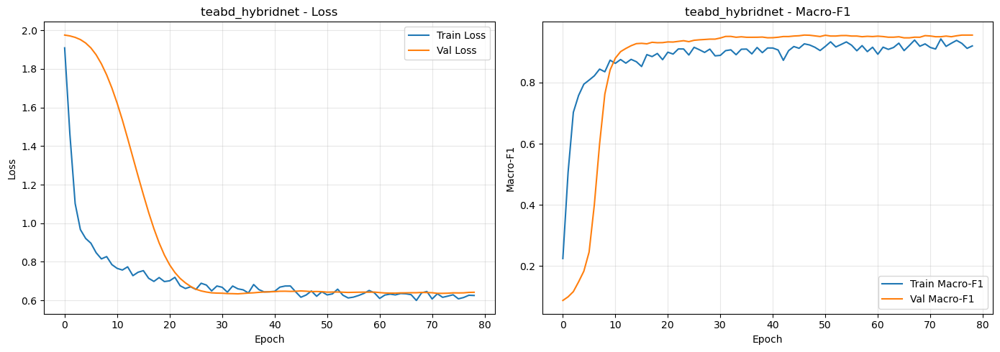

In [16]:
def plot_history(history, model_name="model"):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].plot(history["train_loss"], label="Train Loss")
    axes[0].plot(history["val_loss"], label="Val Loss")
    axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("Loss")
    axes[0].set_title(f"{model_name} - Loss"); axes[0].legend(); axes[0].grid(alpha=0.3)

    axes[1].plot(history["train_f1"], label="Train Macro-F1")
    axes[1].plot(history["val_f1"], label="Val Macro-F1")
    axes[1].set_xlabel("Epoch"); axes[1].set_ylabel("Macro-F1")
    axes[1].set_title(f"{model_name} - Macro-F1"); axes[1].legend(); axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig(f"{FIGURES_DIR}/{model_name}_curves.png", dpi=300, bbox_inches="tight")
    plt.show()

plot_history(history, model_name="teabd_hybridnet")


## 10. Evaluate on Test Set

[OK] Loaded verified checkpoint: checkpoints/teabd_hybridnet_best.pt
=== teabd_hybridnet Test Results ===
Test Loss: 0.2747
Test Accuracy: 0.9511
Test Macro-F1: 0.9417

                 precision    recall  f1-score   support

algal_leaf_spot     0.8657    0.9062    0.8855        64
   brown_blight     0.8947    0.8831    0.8889        77
    gray_blight     0.9363    0.9608    0.9484       153
     helopeltis     0.9271    0.9674    0.9468        92
     red_spider     0.9737    0.9487    0.9610        78
green_mirid_bug     0.9945    0.9430    0.9681       193
        healthy     0.9860    1.0000    0.9930       141

       accuracy                         0.9511       798
      macro avg     0.9397    0.9442    0.9417       798
   weighted avg     0.9521    0.9511    0.9513       798



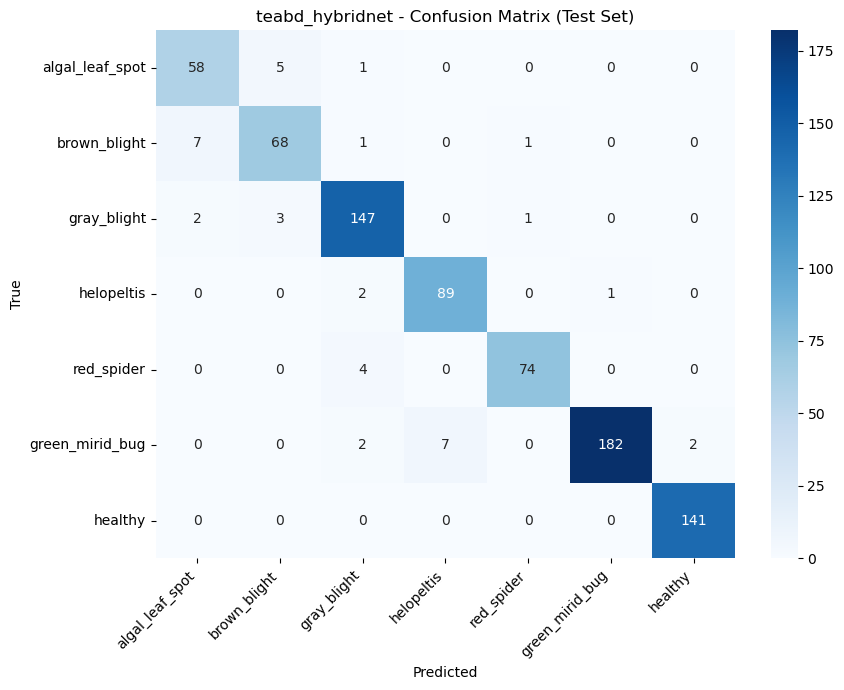

[OK] Loaded verified checkpoint: checkpoints/teabd_hybridnet_best.pt
=== teabd_hybridnet [+TTA] Test Results ===
Test Loss: n/a (TTA)
Test Accuracy: 0.9524
Test Macro-F1: 0.9427

                 precision    recall  f1-score   support

algal_leaf_spot     0.8788    0.9062    0.8923        64
   brown_blight     0.8947    0.8831    0.8889        77
    gray_blight     0.9423    0.9608    0.9515       153
     helopeltis     0.9271    0.9674    0.9468        92
     red_spider     0.9733    0.9359    0.9542        78
green_mirid_bug     0.9840    0.9534    0.9684       193
        healthy     0.9930    1.0000    0.9965       141

       accuracy                         0.9524       798
      macro avg     0.9419    0.9438    0.9427       798
   weighted avg     0.9529    0.9524    0.9525       798



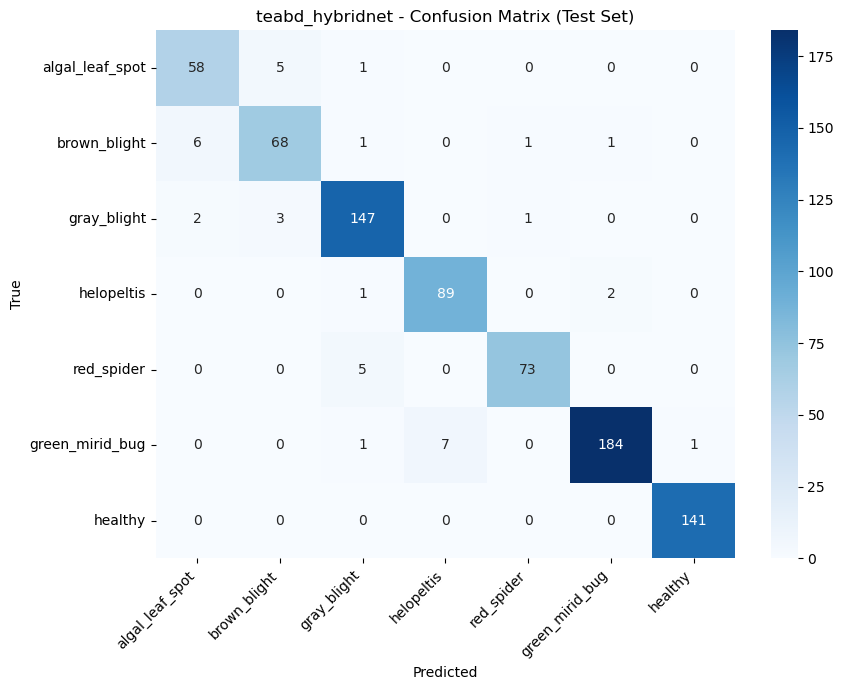

In [17]:
def evaluate_test_set(model, ckpt_path, test_loader, device, model_name="model", tta=False):
    """tta=False (default) is the exact original behavior, used for every baseline
    and for the fair, apples-to-apples hybrid number. tta=True (v2.3 addition)
    averages softmax over each image and its horizontal flip - only ever used for
    the clearly-labeled '+TTA' hybrid result, never mixed silently into baseline
    numbers."""
    checkpoint, loaded_from = safe_load_checkpoint(ckpt_path, map_location=device)
    if checkpoint is None:
        raise FileNotFoundError(
            f"No valid (checksum-verified) checkpoint found at {ckpt_path}. "
            "Training may not have completed, or the file was corrupted."
        )
    model.load_state_dict(checkpoint["model_state_dict"])
    model.eval()

    if tta:
        probs, labels = predict_proba_tta(model, test_loader, device, hflip=True)
        preds = probs.argmax(axis=1)
        test_acc = accuracy_score(labels, preds)
        test_f1 = f1_score(labels, preds, average="macro")
        test_loss = float("nan")  # TTA-averaged probs don't map back to a single CE loss value
    else:
        criterion = nn.CrossEntropyLoss()
        test_loss, test_acc, test_f1, preds, labels = evaluate(model, test_loader, criterion, device)

    print(f"=== {model_name}{' [+TTA]' if tta else ''} Test Results ===")
    print(f"Test Loss: {test_loss:.4f}" if tta is False else "Test Loss: n/a (TTA)")
    print(f"Test Accuracy: {test_acc:.4f}")
    print(f"Test Macro-F1: {test_f1:.4f}")
    print()
    print(classification_report(labels, preds, target_names=LABEL_LIST, digits=4))

    cm = confusion_matrix(labels, preds)
    plt.figure(figsize=(9, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=LABEL_LIST, yticklabels=LABEL_LIST)
    plt.xlabel("Predicted"); plt.ylabel("True")
    plt.title(f"{model_name} - Confusion Matrix (Test Set)")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.savefig(f"{FIGURES_DIR}/{model_name}_confusion_matrix.png", dpi=300, bbox_inches="tight")
    plt.show()

    return {"test_loss": test_loss, "test_acc": test_acc, "test_f1": test_f1,
            "preds": preds, "labels": labels}


# Fair, apples-to-apples number (identical protocol to every baseline) ...
results = evaluate_test_set(model, best_ckpt, test_loader, device, model_name="teabd_hybridnet", tta=False)
results_tta = evaluate_test_set(model, best_ckpt, test_loader, device, model_name="teabd_hybridnet", tta=True)


## 11. Additional Evaluation Curves

The standard set of curves expected in a classification paper, beyond accuracy/F1/confusion matrix:

- **ROC curves** (one-vs-rest, per class + micro/macro average) with AUC
- **Precision-Recall curves** (per class + micro/macro average) - more informative than ROC under class imbalance
- **Per-class metrics bar chart** (precision/recall/F1 side by side per class)
- **Calibration curve** (reliability diagram) - checks whether predicted probabilities are trustworthy
- **Prediction confidence histogram** - correct vs incorrect predictions

All figures saved at 300 DPI.

In [18]:
from sklearn.metrics import (roc_curve, auc, precision_recall_curve,
                              average_precision_score, precision_score, recall_score)
from sklearn.preprocessing import label_binarize
from itertools import cycle

@torch.no_grad()
def get_probs_and_labels(model, loader, device):
    model.eval()
    all_probs, all_labels = [], []
    for images, labels in loader:
        images = images.to(device)
        logits = model(images)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        all_probs.append(probs)
        all_labels.extend(labels.numpy())
    return np.concatenate(all_probs, axis=0), np.array(all_labels)


# Reuse the fully trained model (loaded earlier in Section 15 as xai_model;
# falls back to re-loading the best checkpoint if that cell hasn't been run yet)
try:
    curves_model = xai_model
except NameError:
    curves_model = TeaBDHybridNet(num_classes=NUM_CLASSES, pretrained=False, use_fusion=False).to(device)
    curves_ckpt, _ = safe_load_checkpoint(f"{CHECKPOINT_DIR}/teabd_hybridnet_best.pt", map_location=device)
    curves_model.load_state_dict(curves_ckpt["model_state_dict"])
    curves_model.eval()
    
test_probs, test_true = get_probs_and_labels(curves_model, test_loader, device)
test_true_bin = label_binarize(test_true, classes=list(range(NUM_CLASSES)))
print(f"Collected probabilities for {test_probs.shape[0]} test samples, {test_probs.shape[1]} classes.")


[OK] PretrainedCNNBranch: convnext_tiny (768 ch) -> 384 ch
[OK] Loaded verified checkpoint: checkpoints/teabd_hybridnet_best.pt
Collected probabilities for 798 test samples, 7 classes.


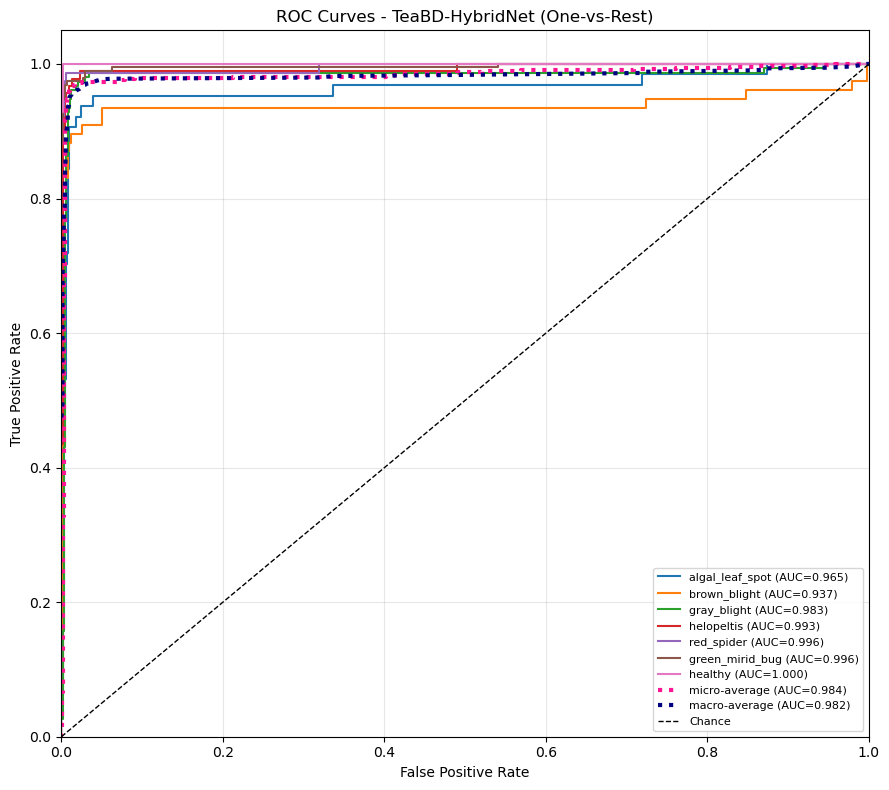

Macro-average AUC: 0.9825
Micro-average AUC: 0.9838


In [19]:
# ---- ROC Curves (one-vs-rest per class + micro/macro average) ----
fpr, tpr, roc_auc = {}, {}, {}
for i in range(NUM_CLASSES):
    fpr[i], tpr[i], _ = roc_curve(test_true_bin[:, i], test_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# micro-average
fpr["micro"], tpr["micro"], _ = roc_curve(test_true_bin.ravel(), test_probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# macro-average
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(NUM_CLASSES)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(NUM_CLASSES):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= NUM_CLASSES
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

plt.figure(figsize=(9, 8))
colors = cycle(plt.cm.tab10.colors)
for i, color in zip(range(NUM_CLASSES), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=1.5,
              label=f"{LABEL_LIST[i]} (AUC={roc_auc[i]:.3f})")
plt.plot(fpr["micro"], tpr["micro"], color="deeppink", linestyle=":", lw=3,
          label=f"micro-average (AUC={roc_auc['micro']:.3f})")
plt.plot(fpr["macro"], tpr["macro"], color="navy", linestyle=":", lw=3,
          label=f"macro-average (AUC={roc_auc['macro']:.3f})")
plt.plot([0, 1], [0, 1], "k--", lw=1, label="Chance")
plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("ROC Curves - TeaBD-HybridNet (One-vs-Rest)")
plt.legend(loc="lower right", fontsize=8)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(f"{FIGURES_DIR}/roc_curves.png", dpi=300, bbox_inches="tight")
plt.show()

print(f"Macro-average AUC: {roc_auc['macro']:.4f}")
print(f"Micro-average AUC: {roc_auc['micro']:.4f}")


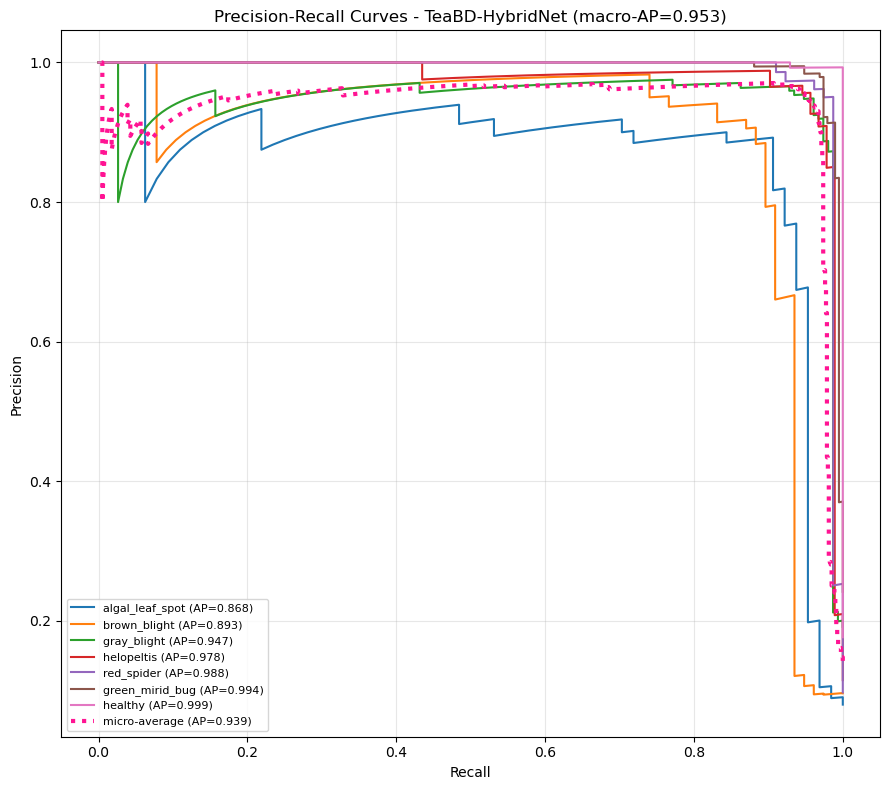

Macro-average AP: 0.9525
Micro-average AP: 0.9386


In [20]:
# ---- Precision-Recall Curves (per class + micro/macro average) ----
precision, recall, avg_precision = {}, {}, {}
for i in range(NUM_CLASSES):
    precision[i], recall[i], _ = precision_recall_curve(test_true_bin[:, i], test_probs[:, i])
    avg_precision[i] = average_precision_score(test_true_bin[:, i], test_probs[:, i])

precision["micro"], recall["micro"], _ = precision_recall_curve(
    test_true_bin.ravel(), test_probs.ravel())
avg_precision["micro"] = average_precision_score(test_true_bin, test_probs, average="micro")
avg_precision["macro"] = average_precision_score(test_true_bin, test_probs, average="macro")

plt.figure(figsize=(9, 8))
colors = cycle(plt.cm.tab10.colors)
for i, color in zip(range(NUM_CLASSES), colors):
    plt.plot(recall[i], precision[i], color=color, lw=1.5,
              label=f"{LABEL_LIST[i]} (AP={avg_precision[i]:.3f})")
plt.plot(recall["micro"], precision["micro"], color="deeppink", linestyle=":", lw=3,
          label=f"micro-average (AP={avg_precision['micro']:.3f})")
plt.xlabel("Recall"); plt.ylabel("Precision")
plt.title(f"Precision-Recall Curves - TeaBD-HybridNet (macro-AP={avg_precision['macro']:.3f})")
plt.legend(loc="lower left", fontsize=8)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(f"{FIGURES_DIR}/precision_recall_curves.png", dpi=300, bbox_inches="tight")
plt.show()

print(f"Macro-average AP: {avg_precision['macro']:.4f}")
print(f"Micro-average AP: {avg_precision['micro']:.4f}")


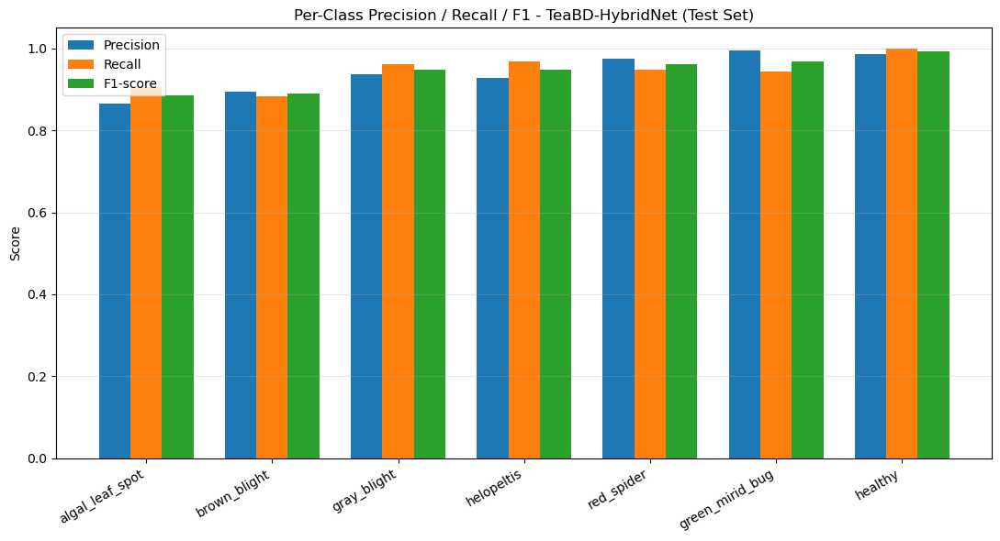

In [21]:
# ---- Per-class Precision / Recall / F1 bar chart ----
test_preds = test_probs.argmax(axis=1)

per_class_precision = precision_score(test_true, test_preds, average=None, labels=range(NUM_CLASSES), zero_division=0)
per_class_recall = recall_score(test_true, test_preds, average=None, labels=range(NUM_CLASSES), zero_division=0)
per_class_f1 = f1_score(test_true, test_preds, average=None, labels=range(NUM_CLASSES), zero_division=0)

x = np.arange(NUM_CLASSES)
width = 0.25

fig, ax = plt.subplots(figsize=(11, 6))
ax.bar(x - width, per_class_precision, width, label="Precision")
ax.bar(x, per_class_recall, width, label="Recall")
ax.bar(x + width, per_class_f1, width, label="F1-score")
ax.set_xticks(x)
ax.set_xticklabels(LABEL_LIST, rotation=30, ha="right")
ax.set_ylabel("Score")
ax.set_ylim(0, 1.05)
ax.set_title("Per-Class Precision / Recall / F1 - TeaBD-HybridNet (Test Set)")
ax.legend()
ax.grid(alpha=0.3, axis="y")
plt.tight_layout()
plt.savefig(f"{FIGURES_DIR}/per_class_metrics.png", dpi=300, bbox_inches="tight")
plt.show()


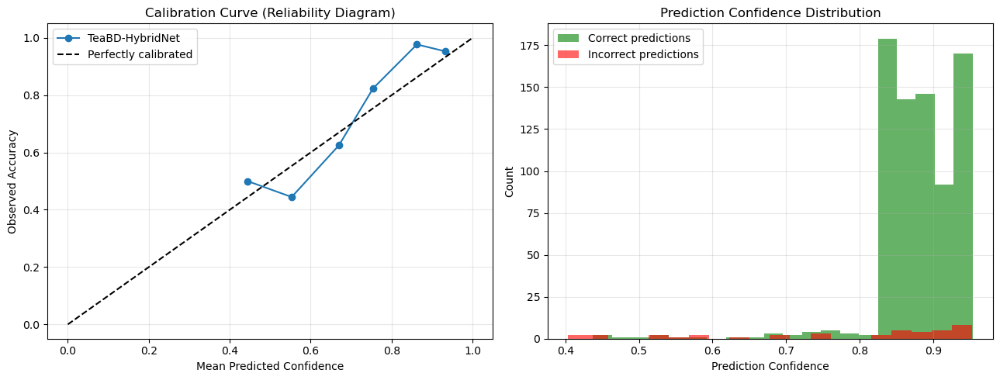

Expected Calibration Error (ECE): 0.0798  (lower is better; well-calibrated models are close to 0)


In [22]:
# ---- Calibration Curve (Reliability Diagram) ----
from sklearn.calibration import calibration_curve

# Use the max predicted probability (confidence) and whether that prediction was correct
confidences = test_probs.max(axis=1)
correct = (test_preds == test_true).astype(int)

prob_true, prob_pred = calibration_curve(correct, confidences, n_bins=10, strategy="uniform")

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

axes[0].plot(prob_pred, prob_true, marker="o", label="TeaBD-HybridNet")
axes[0].plot([0, 1], [0, 1], "k--", label="Perfectly calibrated")
axes[0].set_xlabel("Mean Predicted Confidence")
axes[0].set_ylabel("Observed Accuracy")
axes[0].set_title("Calibration Curve (Reliability Diagram)")
axes[0].legend(); axes[0].grid(alpha=0.3)

# ---- Prediction confidence histogram: correct vs incorrect ----
axes[1].hist(confidences[correct == 1], bins=20, alpha=0.6, label="Correct predictions", color="green")
axes[1].hist(confidences[correct == 0], bins=20, alpha=0.6, label="Incorrect predictions", color="red")
axes[1].set_xlabel("Prediction Confidence")
axes[1].set_ylabel("Count")
axes[1].set_title("Prediction Confidence Distribution")
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f"{FIGURES_DIR}/calibration_and_confidence.png", dpi=300, bbox_inches="tight")
plt.show()

# Expected Calibration Error (ECE) - single-number summary
def expected_calibration_error(confidences, correct, n_bins=10):
    bin_edges = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        mask = (confidences > bin_edges[i]) & (confidences <= bin_edges[i+1])
        if mask.sum() == 0:
            continue
        bin_acc = correct[mask].mean()
        bin_conf = confidences[mask].mean()
        ece += (mask.sum() / len(confidences)) * abs(bin_acc - bin_conf)
    return ece

ece = expected_calibration_error(confidences, correct)
print(f"Expected Calibration Error (ECE): {ece:.4f}  (lower is better; well-calibrated models are close to 0)")


## 12. Baseline vs TeaBD-HybridNet Comparison Chart

Run this after Section 13 (baselines) has produced `baseline_results.csv`.

In [23]:
# %% [markdown]
# ## 12. Baseline Comparison Chart (baselines only, no proposed-model rows)

try:
    comparison_df = pd.read_csv(f"{TABLES_DIR}/baseline_results.csv")
except FileNotFoundError:
    comparison_df = pd.DataFrame()
    print("[INFO] baseline_results.csv not found yet - run Section 15 first.")

if not comparison_df.empty:
    full_comparison = comparison_df.sort_values("test_f1", ascending=True)

    fig, ax = plt.subplots(figsize=(10, max(5, 0.5 * len(full_comparison))))
    ax.barh(full_comparison["model"], full_comparison["test_f1"], color="#1f77b4")
    ax.set_xlabel("Test Macro-F1")
    ax.set_title("Baseline Model Comparison")
    ax.grid(alpha=0.3, axis="x")
    plt.tight_layout()
    plt.savefig(f"{FIGURES_DIR}/baseline_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

    full_comparison.to_csv(f"{TABLES_DIR}/full_model_comparison.csv", index=False)
    full_comparison

[INFO] baseline_results.csv not found yet - run Section 15 first.


## 13. Parameter / FLOPs Count (for paper's efficiency table)

Install `thop` if not already: `pip install thop --break-system-packages`

In [61]:
# %% [markdown]
# ## 13. Parameter / FLOPs Count (for TeaBD-HybridNet)
try:
    import copy
    from thop import profile
    profiling_copy = copy.deepcopy(model)
    dummy_input = torch.randn(1, 3, 224, 224).to(device)
    flops, params = profile(profiling_copy, inputs=(dummy_input,), verbose=False)
    del profiling_copy
    print(f"FLOPs: {flops/1e9:.3f} G")
    print(f"Params: {params/1e6:.3f} M")
    inference_ms_hybrid = measure_inference_time(model)
    print(f"Inference time: {inference_ms_hybrid:.3f} ms")
except ImportError:
    print("Install thop for FLOPs counting: pip install thop --break-system-packages")
    total_params = sum(p.numel() for p in model.parameters())
    print(f"Params (fallback count): {total_params/1e6:.3f} M")

# # %% [markdown]
# # ## 14. Checkpoint Health Check
# # UNCHANGED — inspect_checkpoints() function itself
# inspect_checkpoints("teabd_hybridnet")

FLOPs: 8.697 G
Params: 49.782 M
Inference time: 11.691 ms


## 14. Checkpoint Health Check (optional utility)

Run this any time to inspect all checkpoints for a model and confirm which ones
are valid (checksum-verified) vs corrupted.

In [25]:
def inspect_checkpoints(model_name, checkpoint_dir=None):
    checkpoint_dir = Path(checkpoint_dir or CHECKPOINT_DIR)
    candidates = sorted(checkpoint_dir.glob(f"{model_name}_*.pt"))
    if not candidates:
        print(f"No checkpoints found for '{model_name}' in {checkpoint_dir}")
        return

    print(f"{'Checkpoint':40s} {'Valid':>8s} {'Epoch':>8s} {'Best F1':>10s} {'Size (MB)':>12s}")
    print("-" * 82)
    for ckpt_path in candidates:
        valid = verify_checkpoint(ckpt_path)
        size_mb = ckpt_path.stat().st_size / 1e6
        epoch_str, f1_str = "?", "?"
        if valid:
            try:
                ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
                epoch_str = str(ckpt.get("epoch", "?"))
                f1_str = f"{ckpt.get('best_val_f1', 0):.4f}"
            except Exception:
                valid = False
        status = "OK" if valid else "CORRUPT"
        print(f"{ckpt_path.name:40s} {status:>8s} {epoch_str:>8s} {f1_str:>10s} {size_mb:>12.2f}")


inspect_checkpoints("teabd_hybridnet")


Checkpoint                                  Valid    Epoch    Best F1    Size (MB)
----------------------------------------------------------------------------------
teabd_hybridnet_best.pt                        OK       46     0.9551       798.73
teabd_hybridnet_latest.pt                      OK       78     0.9551       798.66
teabd_hybridnet_periodic_0.pt                  OK       64     0.9551       798.66
teabd_hybridnet_periodic_1.pt                  OK       69     0.9551       798.66
teabd_hybridnet_periodic_2.pt                  OK       74     0.9551       798.66


## 15. Baseline Models 




Training baseline: resnet50 (resnet50)
[OK] Loaded verified checkpoint: checkpoints/baseline_resnet50_latest.pt
[RESUME] Continuing training from epoch 57 (best_val_f1 so far: 0.9239)
Epoch  58/150 | train_loss=0.5778 train_acc=0.9685 train_f1=0.9654 | val_loss=0.7182 val_acc=0.9214 val_f1=0.9041 | 71.4s
Early stopping at epoch 58 (no improvement for 30 epochs).

Best val F1: 0.9239 | Best checkpoint: checkpoints/baseline_resnet50_best.pt
Latest checkpoint (for resuming): checkpoints/baseline_resnet50_latest.pt
[OK] Loaded verified checkpoint: checkpoints/baseline_resnet50_best.pt
=== baseline_resnet50 Test Results ===
Test Loss: 0.3205
Test Accuracy: 0.9261
Test Macro-F1: 0.9113

                 precision    recall  f1-score   support

algal_leaf_spot     0.7867    0.9219    0.8489        64
   brown_blight     0.9180    0.7273    0.8116        77
    gray_blight     0.9068    0.9542    0.9299       153
     helopeltis     0.9043    0.9239    0.9140        92
     red_spider     0.9

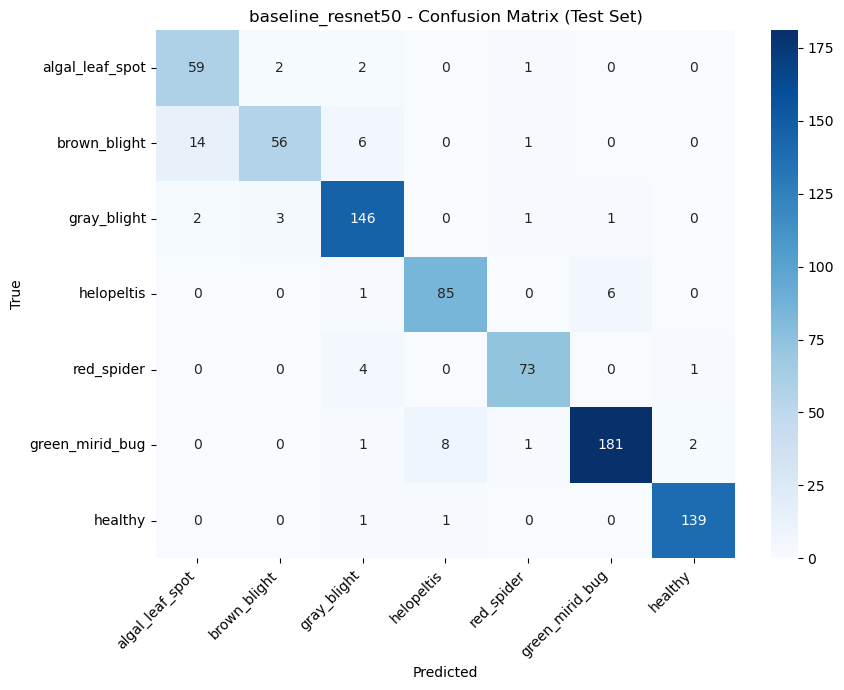


Training baseline: efficientnet_b3 (efficientnet_b3)
[OK] Loaded verified checkpoint: checkpoints/baseline_efficientnet_b3_latest.pt
[RESUME] Continuing training from epoch 89 (best_val_f1 so far: 0.9378)
Epoch  90/150 | train_loss=0.5282 train_acc=0.9913 train_f1=0.9905 | val_loss=0.7055 val_acc=0.9354 val_f1=0.9213 | 70.7s
  -> Periodic checkpoint saved: baseline_efficientnet_b3_periodic_1.pt
Early stopping at epoch 90 (no improvement for 30 epochs).

Best val F1: 0.9378 | Best checkpoint: checkpoints/baseline_efficientnet_b3_best.pt
Latest checkpoint (for resuming): checkpoints/baseline_efficientnet_b3_latest.pt
[OK] Loaded verified checkpoint: checkpoints/baseline_efficientnet_b3_best.pt
=== baseline_efficientnet_b3 Test Results ===
Test Loss: 0.3464
Test Accuracy: 0.9248
Test Macro-F1: 0.9119

                 precision    recall  f1-score   support

algal_leaf_spot     0.8462    0.8594    0.8527        64
   brown_blight     0.8472    0.7922    0.8188        77
    gray_blight  

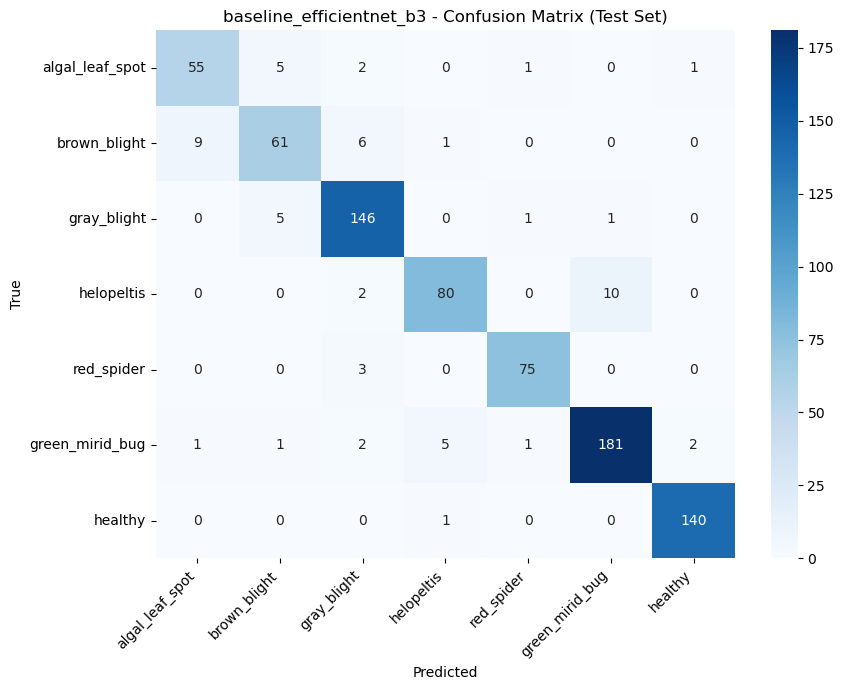


Training baseline: mobilenetv3_large (mobilenetv3_large_100)
[OK] Loaded verified checkpoint: checkpoints/baseline_mobilenetv3_large_latest.pt
[RESUME] Continuing training from epoch 107 (best_val_f1 so far: 0.9398)
Epoch 108/150 | train_loss=0.5307 train_acc=0.9905 train_f1=0.9895 | val_loss=0.6583 val_acc=0.9417 val_f1=0.9337 | 35.3s
Early stopping at epoch 108 (no improvement for 30 epochs).

Best val F1: 0.9398 | Best checkpoint: checkpoints/baseline_mobilenetv3_large_best.pt
Latest checkpoint (for resuming): checkpoints/baseline_mobilenetv3_large_latest.pt
[OK] Loaded verified checkpoint: checkpoints/baseline_mobilenetv3_large_best.pt
=== baseline_mobilenetv3_large Test Results ===
Test Loss: 0.3518
Test Accuracy: 0.9211
Test Macro-F1: 0.9049

                 precision    recall  f1-score   support

algal_leaf_spot     0.8525    0.8125    0.8320        64
   brown_blight     0.8406    0.7532    0.7945        77
    gray_blight     0.9051    0.9346    0.9196       153
     helope

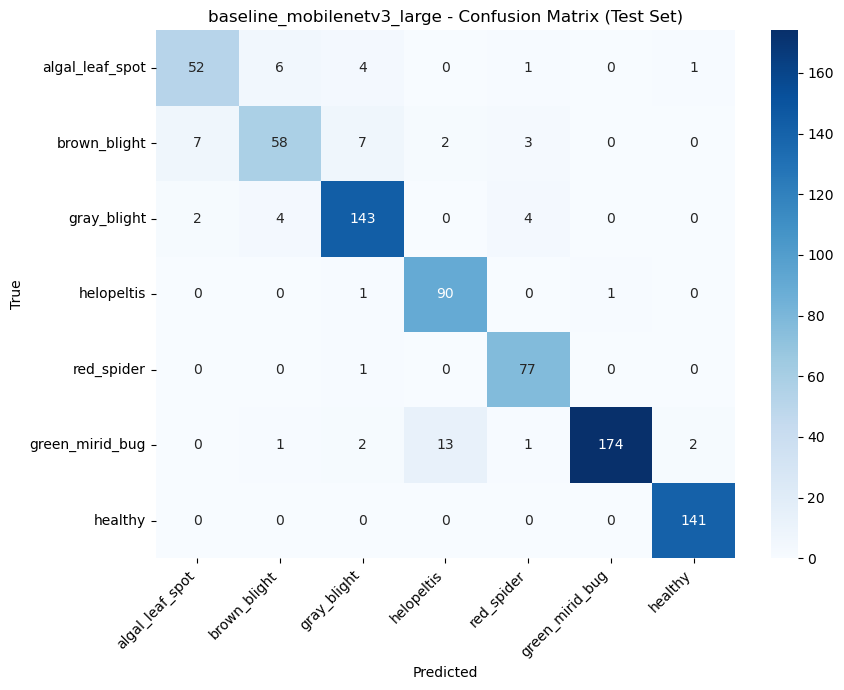


Training baseline: densenet201 (densenet201)
[INFO] No valid checkpoint found among candidates.
Epoch   1/150 | train_loss=1.5442 train_acc=0.5120 train_f1=0.4890 | val_loss=0.9645 val_acc=0.8289 val_f1=0.8107 | 64.4s
  -> New best val F1: 0.8107, best checkpoint updated.
Epoch   2/150 | train_loss=1.0168 train_acc=0.7682 train_f1=0.7411 | val_loss=0.7749 val_acc=0.8847 val_f1=0.8658 | 77.6s
  -> New best val F1: 0.8658, best checkpoint updated.
Epoch   3/150 | train_loss=0.9253 train_acc=0.8073 train_f1=0.7852 | val_loss=0.7762 val_acc=0.8910 val_f1=0.8818 | 72.1s
  -> New best val F1: 0.8818, best checkpoint updated.
Epoch   4/150 | train_loss=0.8914 train_acc=0.8239 train_f1=0.8056 | val_loss=0.8701 val_acc=0.8441 val_f1=0.8137 | 67.0s
Epoch   5/150 | train_loss=0.8748 train_acc=0.8337 train_f1=0.8164 | val_loss=0.7861 val_acc=0.8821 val_f1=0.8679 | 64.6s
  -> Periodic checkpoint saved: baseline_densenet201_periodic_0.pt
Epoch   6/150 | train_loss=0.8270 train_acc=0.8628 train_f1=0

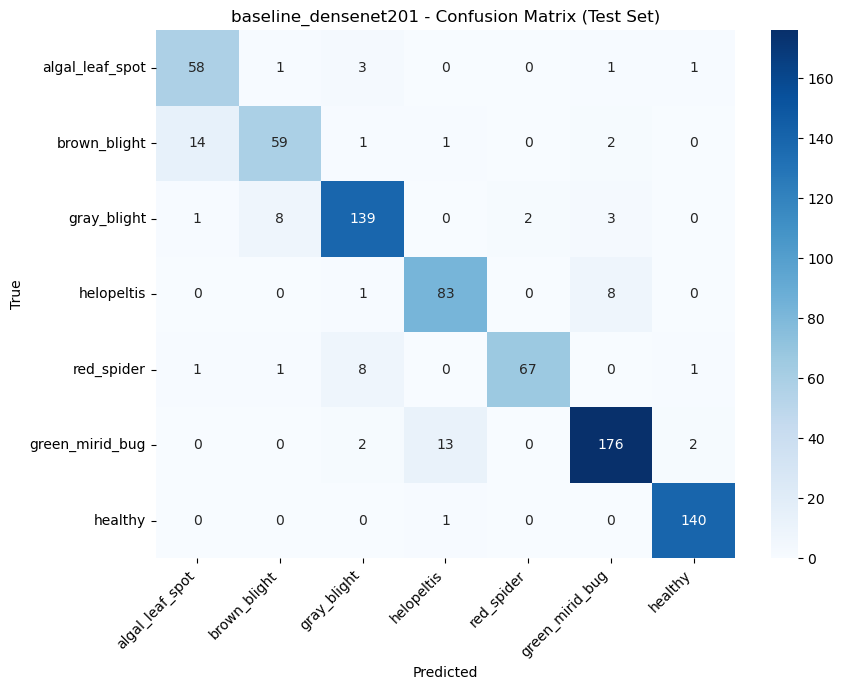


Training baseline: vit_small (vit_small_patch16_224)
[INFO] No valid checkpoint found among candidates.
Epoch   1/150 | train_loss=1.5557 train_acc=0.4783 train_f1=0.4518 | val_loss=1.0384 val_acc=0.7440 val_f1=0.7150 | 64.7s
  -> New best val F1: 0.7150, best checkpoint updated.
Epoch   2/150 | train_loss=1.0815 train_acc=0.7296 train_f1=0.7025 | val_loss=0.8758 val_acc=0.8150 val_f1=0.8087 | 87.7s
  -> New best val F1: 0.8087, best checkpoint updated.
Epoch   3/150 | train_loss=0.9464 train_acc=0.7992 train_f1=0.7790 | val_loss=0.7889 val_acc=0.8479 val_f1=0.8348 | 95.6s
  -> New best val F1: 0.8348, best checkpoint updated.
Epoch   4/150 | train_loss=0.9404 train_acc=0.7978 train_f1=0.7761 | val_loss=0.7922 val_acc=0.8821 val_f1=0.8726 | 68.4s
  -> New best val F1: 0.8726, best checkpoint updated.
Epoch   5/150 | train_loss=0.9280 train_acc=0.8103 train_f1=0.7903 | val_loss=0.9806 val_acc=0.7744 val_f1=0.7610 | 83.5s
  -> Periodic checkpoint saved: baseline_vit_small_periodic_0.pt


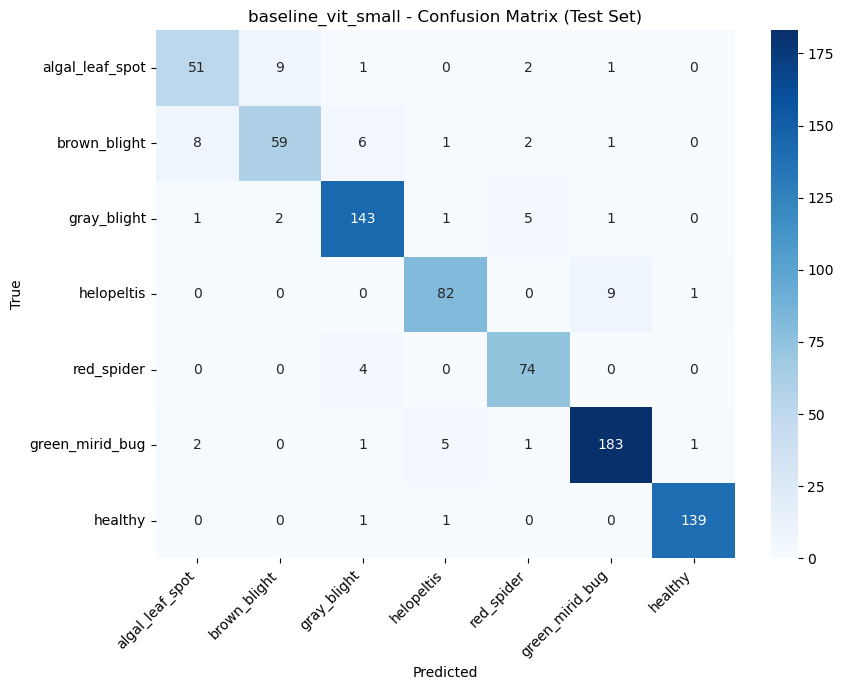


Training baseline: deit_small (deit_small_patch16_224)
[INFO] No valid checkpoint found among candidates.
Epoch   1/150 | train_loss=1.4339 train_acc=0.5587 train_f1=0.5290 | val_loss=1.0265 val_acc=0.7288 val_f1=0.7118 | 23.5s
  -> New best val F1: 0.7118, best checkpoint updated.
Epoch   2/150 | train_loss=1.0172 train_acc=0.7571 train_f1=0.7362 | val_loss=0.9330 val_acc=0.7693 val_f1=0.7566 | 23.6s
  -> New best val F1: 0.7566, best checkpoint updated.
Epoch   3/150 | train_loss=0.9356 train_acc=0.8024 train_f1=0.7816 | val_loss=0.8799 val_acc=0.7617 val_f1=0.7591 | 23.7s
  -> New best val F1: 0.7591, best checkpoint updated.
Epoch   4/150 | train_loss=0.9108 train_acc=0.8087 train_f1=0.7897 | val_loss=0.8343 val_acc=0.8340 val_f1=0.8207 | 23.4s
  -> New best val F1: 0.8207, best checkpoint updated.
Epoch   5/150 | train_loss=0.9195 train_acc=0.8038 train_f1=0.7855 | val_loss=0.8439 val_acc=0.8517 val_f1=0.8359 | 23.6s
  -> New best val F1: 0.8359, best checkpoint updated.
  -> Per

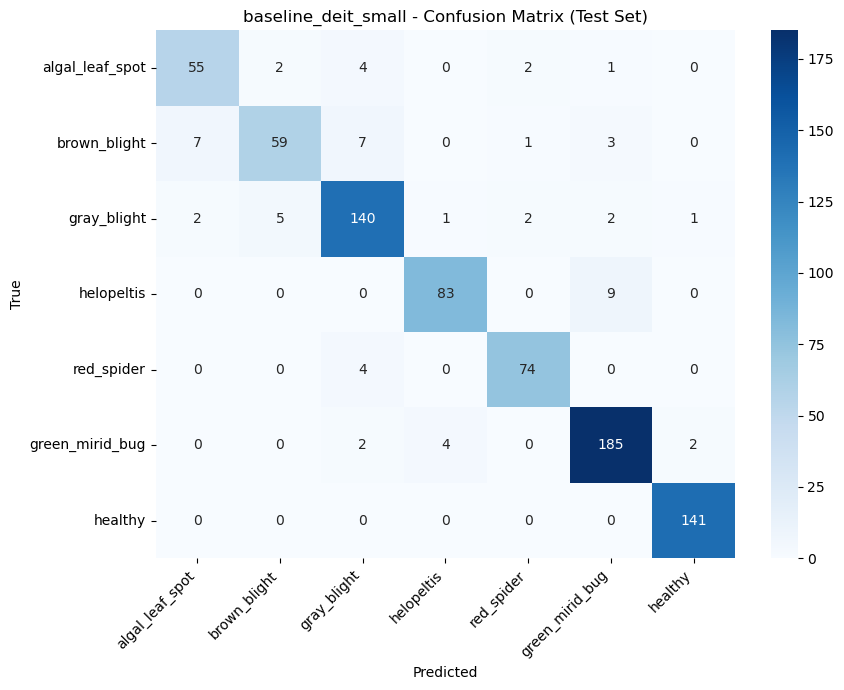


Training baseline: swin_tiny (swin_tiny_patch4_window7_224)
[INFO] No valid checkpoint found among candidates.
Epoch   1/150 | train_loss=1.4212 train_acc=0.5587 train_f1=0.5289 | val_loss=0.9204 val_acc=0.7997 val_f1=0.7831 | 33.5s
  -> New best val F1: 0.7831, best checkpoint updated.
Epoch   2/150 | train_loss=0.9781 train_acc=0.7834 train_f1=0.7586 | val_loss=0.7987 val_acc=0.8390 val_f1=0.8285 | 33.4s
  -> New best val F1: 0.8285, best checkpoint updated.
Epoch   3/150 | train_loss=0.8896 train_acc=0.8245 train_f1=0.7996 | val_loss=0.7682 val_acc=0.8986 val_f1=0.8848 | 35.0s
  -> New best val F1: 0.8848, best checkpoint updated.
Epoch   4/150 | train_loss=0.8485 train_acc=0.8489 train_f1=0.8298 | val_loss=0.7950 val_acc=0.8923 val_f1=0.8704 | 33.3s
Epoch   5/150 | train_loss=0.8466 train_acc=0.8467 train_f1=0.8266 | val_loss=0.8970 val_acc=0.8023 val_f1=0.7972 | 33.3s
  -> Periodic checkpoint saved: baseline_swin_tiny_periodic_0.pt
Epoch   6/150 | train_loss=0.8199 train_acc=0.86

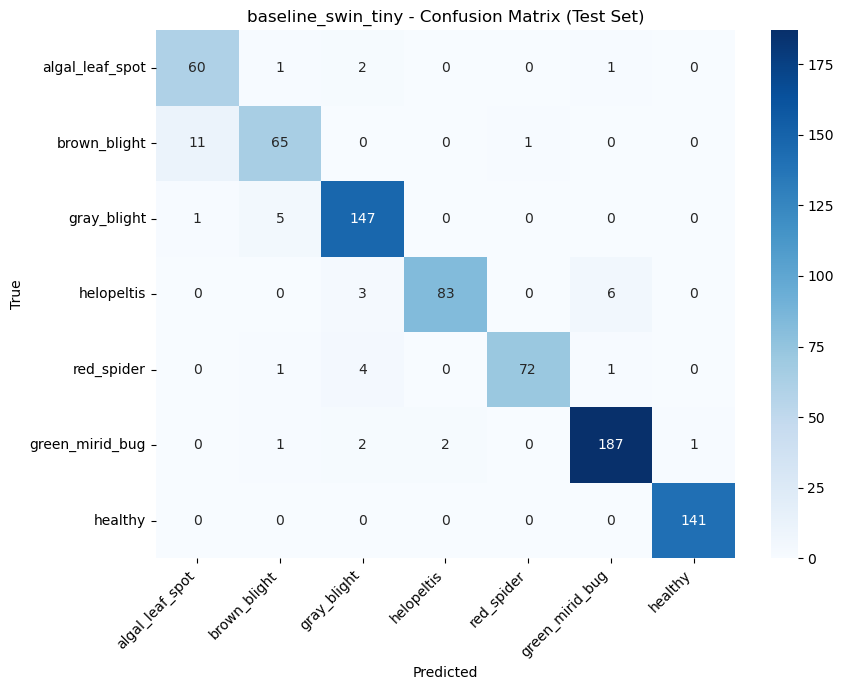


Training baseline: mobilevit_s (mobilevit_s)
[INFO] No valid checkpoint found among candidates.
Epoch   1/150 | train_loss=1.9404 train_acc=0.3609 train_f1=0.3434 | val_loss=1.8986 val_acc=0.5665 val_f1=0.5499 | 23.7s
  -> New best val F1: 0.5499, best checkpoint updated.
Epoch   2/150 | train_loss=1.6673 train_acc=0.6500 train_f1=0.6195 | val_loss=1.3243 val_acc=0.8162 val_f1=0.8053 | 22.8s
  -> New best val F1: 0.8053, best checkpoint updated.
Epoch   3/150 | train_loss=1.2277 train_acc=0.7438 train_f1=0.7157 | val_loss=0.9155 val_acc=0.8378 val_f1=0.8272 | 26.1s
  -> New best val F1: 0.8272, best checkpoint updated.
Epoch   4/150 | train_loss=0.9985 train_acc=0.7984 train_f1=0.7797 | val_loss=0.8237 val_acc=0.8441 val_f1=0.8322 | 26.0s
  -> New best val F1: 0.8322, best checkpoint updated.
Epoch   5/150 | train_loss=0.9356 train_acc=0.8144 train_f1=0.7941 | val_loss=0.7397 val_acc=0.9100 val_f1=0.8995 | 24.7s
  -> New best val F1: 0.8995, best checkpoint updated.
  -> Periodic chec

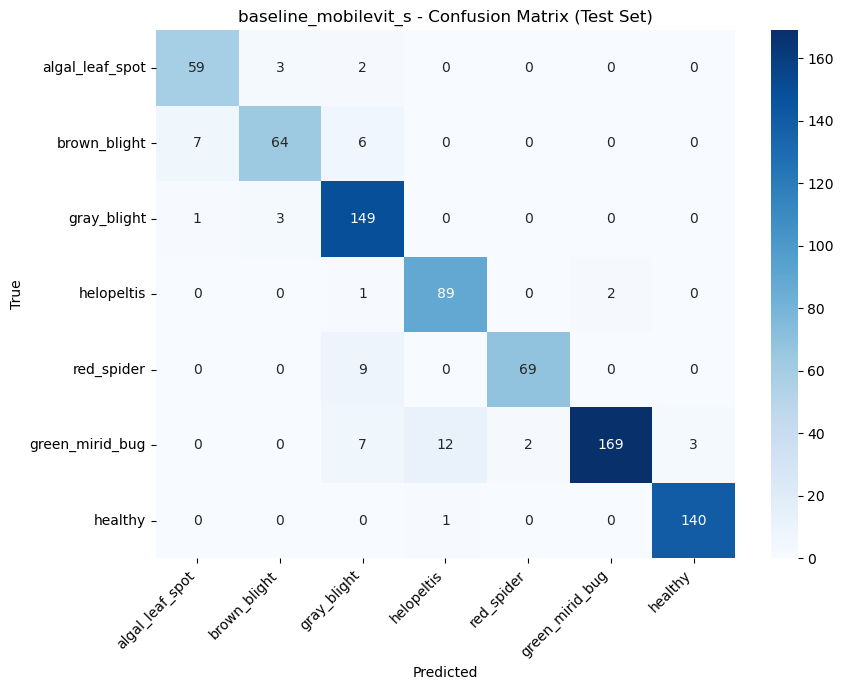


Training baseline: convnext_tiny (convnext_tiny)
[INFO] No valid checkpoint found among candidates.
Epoch   1/150 | train_loss=1.2481 train_acc=0.6543 train_f1=0.6225 | val_loss=0.8124 val_acc=0.8403 val_f1=0.8274 | 27.1s
  -> New best val F1: 0.8274, best checkpoint updated.
Epoch   2/150 | train_loss=0.9114 train_acc=0.8242 train_f1=0.8057 | val_loss=0.7572 val_acc=0.8809 val_f1=0.8650 | 26.7s
  -> New best val F1: 0.8650, best checkpoint updated.
Epoch   3/150 | train_loss=0.8659 train_acc=0.8432 train_f1=0.8220 | val_loss=0.7287 val_acc=0.9062 val_f1=0.8976 | 27.0s
  -> New best val F1: 0.8976, best checkpoint updated.
Epoch   4/150 | train_loss=0.8703 train_acc=0.8438 train_f1=0.8249 | val_loss=0.7769 val_acc=0.8695 val_f1=0.8550 | 27.5s
Epoch   5/150 | train_loss=0.8623 train_acc=0.8505 train_f1=0.8309 | val_loss=0.7654 val_acc=0.8885 val_f1=0.8700 | 27.1s
  -> Periodic checkpoint saved: baseline_convnext_tiny_periodic_0.pt
Epoch   6/150 | train_loss=0.8326 train_acc=0.8560 trai

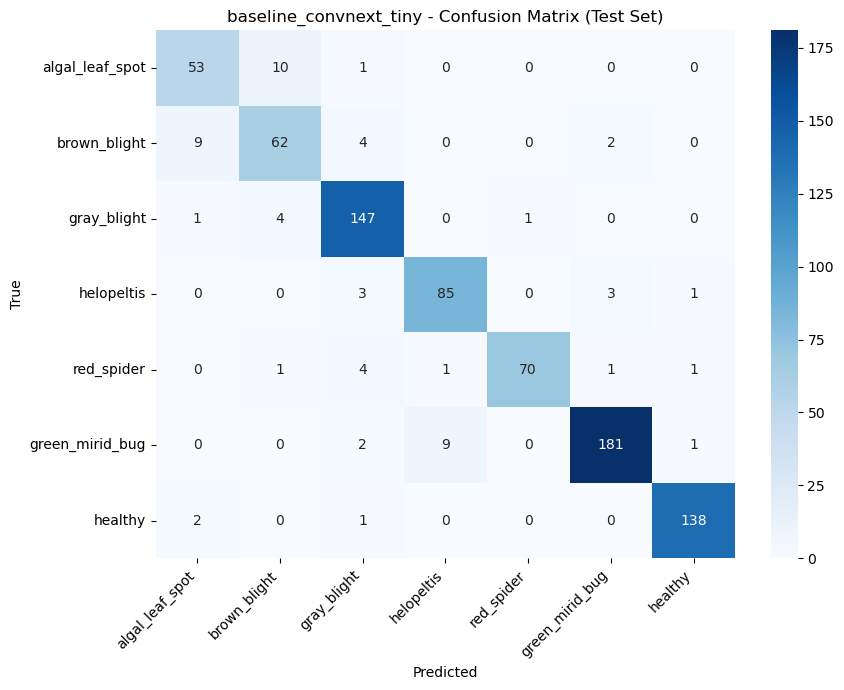


Training baseline: coatnet_0 (coatnet_0_224)
[SKIP] Could not build coatnet_0_224: No pretrained weights exist for coatnet_0_224. Use `pretrained=False` for random init.

Training baseline: mambavision_t (mamba_vision_T)


100%|██████████| 364M/364M [00:34<00:00, 11.2MB/s] 
/home/nafim/anaconda3/envs/tealeaf/lib/python3.10/site-packages/mambavision/models/mamba_vision.py:207: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to 

The model and loaded state dict do not match exactly

size mismatch for head.weight: copying a param with shape torch.Size([1000, 640]) from checkpoint, the shape in current model is torch.Size([7, 640]).
size mismatch for head.bias: copying a param with shape torch.Size([1000]) from checkpoint, the shape in current model is torch.Size([7]).
[INFO] No valid checkpoint found among candidates.
Epoch   1/150 | train_loss=1.7686 train_acc=0.4103 train_f1=0.3792 | val_loss=1.4089 val_acc=0.5932 val_f1=0.5444 | 58.0s
  -> New best val F1: 0.5444, best checkpoint updated.
Epoch   2/150 | train_loss=1.1994 train_acc=0.6948 train_f1=0.6616 | val_loss=0.8682 val_acc=0.8466 val_f1=0.8358 | 27.3s
  -> New best val F1: 0.8358, best checkpoint updated.
Epoch   3/150 | train_loss=1.0056 train_acc=0.7812 train_f1=0.7561 | val_loss=0.8232 val_acc=0.8580 val_f1=0.8424 | 27.3s
  -> New best val F1: 0.8424, best checkpoint updated.
Epoch   4/150 | train_loss=0.9202 train_acc=0.8168 train_f1=0.7975 | val_l

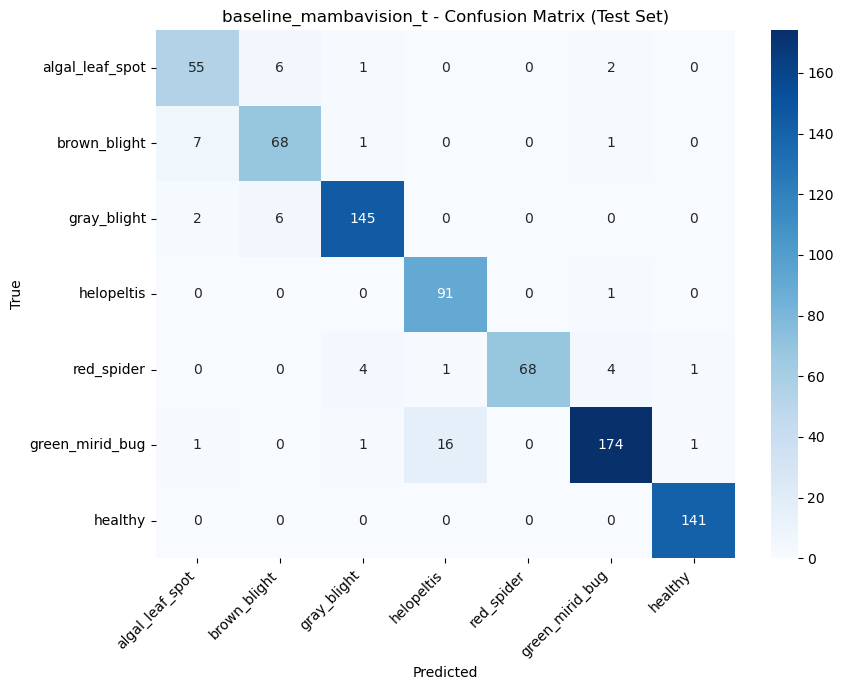



All baselines complete.


,model,params_M,flops_G,inference_ms,test_acc,test_f1
0,swin_tiny,27.524737,4.371089,9.871944,0.946115,0.935177
1,mobilevit_s,4.942119,1.420210,8.711481,0.926065,0.920145
2,mambavision_t,31.157735,4.471245,9.494042,0.929825,0.918891
3,deit_small,21.668359,4.240837,4.677057,0.923559,0.911946
4,efficientnet_b3,10.706991,0.961260,12.041950,0.924812,0.911859
5,resnet50,23.522375,4.131709,5.418619,0.926065,0.911261
6,convnext_tiny,27.825511,4.454807,5.080517,0.922306,0.905754
7,mobilenetv3_large,4.210999,0.215358,5.818518,0.921053,0.904856
8,vit_small,21.668359,4.240837,4.450838,0.916040,0.897372
9,densenet201,18.106375,4.289750,25.160631,0.904762,0.891586


In [26]:

# ## 15. Baseline Models (timm baselines + MambaVision)

BASELINE_MODELS = {
    "resnet50":          "resnet50",
    "efficientnet_b3":   "efficientnet_b3",
    "mobilenetv3_large": "mobilenetv3_large_100",
    "densenet201":       "densenet201",
    "vit_small":         "vit_small_patch16_224",
    "deit_small":        "deit_small_patch16_224",
    "swin_tiny":         "swin_tiny_patch4_window7_224",
    "mobilevit_s":       "mobilevit_s",
    "convnext_tiny":     "convnext_tiny",
    "coatnet_0":         "coatnet_0_224",
}

def build_baseline(timm_name, num_classes=NUM_CLASSES, pretrained=True):
    model = timm.create_model(timm_name, pretrained=pretrained, num_classes=num_classes)
    return model.to(device)


# %%
def count_params_flops(model, input_size=(1, 3, 224, 224)):
    total_params = sum(p.numel() for p in model.parameters())
    try:
        from thop import profile
        dummy = torch.randn(*input_size).to(device)
        flops, _ = profile(model, inputs=(dummy,), verbose=False)
    except Exception:
        flops = float("nan")
    return total_params, flops


@torch.no_grad()
def measure_inference_time(model, input_size=(1, 3, 224, 224), n_warmup=5, n_runs=30):
    model.eval()
    dummy = torch.randn(*input_size).to(device)
    for _ in range(n_warmup):
        _ = model(dummy)
    if device.type == "cuda":
        torch.cuda.synchronize()
    t0 = time.time()
    for _ in range(n_runs):
        _ = model(dummy)
    if device.type == "cuda":
        torch.cuda.synchronize()
    elapsed = (time.time() - t0) / n_runs
    return elapsed * 1000


# %%
BASELINE_EPOCHS = 150
BASELINE_PATIENCE = 30

baseline_results = []

# ---- timm baselines ----
for short_name, timm_name in BASELINE_MODELS.items():
    print(f"\n{'='*70}\nTraining baseline: {short_name} ({timm_name})\n{'='*70}")
    try:
        model_b = build_baseline(timm_name)
    except Exception as e:
        print(f"[SKIP] Could not build {timm_name}: {e}")
        continue

    profiling_copy = copy.deepcopy(model_b)
    total_params_b, flops_b = count_params_flops(profiling_copy)
    del profiling_copy
    inference_ms = measure_inference_time(model_b)

    history_b, best_ckpt_b = train_model(
        model_b, train_loader, val_loader,
        num_epochs=BASELINE_EPOCHS,
        class_weights=class_weights,
        model_name=f"baseline_{short_name}",
        resume=True,
        periodic_every=5,
        keep_last=2,
        patience=BASELINE_PATIENCE,
    )

    results_b = evaluate_test_set(model_b, best_ckpt_b, test_loader, device, model_name=f"baseline_{short_name}")

    baseline_results.append({
        "model": short_name,
        "params_M": total_params_b / 1e6,
        "flops_G": flops_b / 1e9 if flops_b == flops_b else None,
        "inference_ms": inference_ms,
        "test_acc": results_b["test_acc"],
        "test_f1": results_b["test_f1"],
    })

    del model_b
    if device.type == "cuda":
        torch.cuda.empty_cache()

# ---- MambaVision (separate build path — not a timm model) ----
print(f"\n{'='*70}\nTraining baseline: mambavision_t (mamba_vision_T)\n{'='*70}")
try:
    model_b = build_mambavision(num_classes=NUM_CLASSES, pretrained=True)

    profiling_copy = copy.deepcopy(model_b)
    total_params_b, flops_b = count_params_flops(profiling_copy)
    del profiling_copy
    inference_ms = measure_inference_time(model_b)

    history_b, best_ckpt_b = train_model(
        model_b, train_loader, val_loader,
        num_epochs=BASELINE_EPOCHS,
        class_weights=class_weights,
        model_name="baseline_mambavision_t",
        resume=True,
        periodic_every=5,
        keep_last=2,
        patience=BASELINE_PATIENCE,
    )

    results_b = evaluate_test_set(model_b, best_ckpt_b, test_loader, device, model_name="baseline_mambavision_t")

    baseline_results.append({
        "model": "mambavision_t",
        "params_M": total_params_b / 1e6,
        "flops_G": flops_b / 1e9 if flops_b == flops_b else None,
        "inference_ms": inference_ms,
        "test_acc": results_b["test_acc"],
        "test_f1": results_b["test_f1"],
    })

    del model_b
    if device.type == "cuda":
        torch.cuda.empty_cache()
except Exception as e:
    print(f"[SKIP] Could not train mambavision_t: {e}")

print("\n\nAll baselines complete.")


# %%
baseline_df = pd.DataFrame(baseline_results)
baseline_df = baseline_df.sort_values("test_f1", ascending=False).reset_index(drop=True)
baseline_df.to_csv(f"{TABLES_DIR}/baseline_results.csv", index=False)
baseline_df

## 16. Explainable AI (XAI) Suite

Four complementary interpretability methods on the **final trained TeaBD-HybridNet**
(loaded from its best checkpoint):

- **Grad-CAM**: which spatial regions drove the prediction
- **LIME**: which superpixels were most influential
- **SHAP**: feature attribution with theoretical guarantees
- **t-SNE**: how well-separated are the learned class embeddings

Install if needed: `pip install grad-cam lime shap --break-system-packages`

[OK] PretrainedCNNBranch: convnext_tiny (768 ch) -> 384 ch
[OK] Loaded verified checkpoint: checkpoints/teabd_hybridnet_best.pt
[OK] Model loaded for XAI analysis.


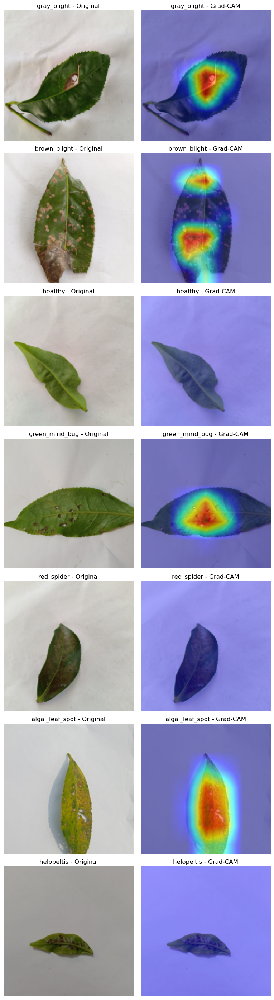

In [27]:
# %% [markdown]
# ## 16. Explainable AI (XAI) Suite (on TeaBD-HybridNet)

xai_model = TeaBDHybridNet(num_classes=NUM_CLASSES, pretrained=False, use_fusion=False).to(device)
xai_ckpt, _ = safe_load_checkpoint(f"{CHECKPOINT_DIR}/teabd_hybridnet_best.pt", map_location=device)
xai_model.load_state_dict(xai_ckpt["model_state_dict"])
xai_model.eval()
print("[OK] Model loaded for XAI analysis.")

# %%
# ---- Grad-CAM ----
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

def get_cnn_target_layer(model):
    cnn = model.cnn_branch
    if hasattr(cnn, "project"):
        for m in reversed(list(cnn.project)):
            if isinstance(m, nn.Conv2d):
                return m
    last_conv = None
    for m in cnn.modules():
        if isinstance(m, nn.Conv2d):
            last_conv = m
    return last_conv

target_layers = [get_cnn_target_layer(xai_model)]

def gradcam_on_sample(model, dataset, idx, target_layers):
    img_tensor, label = dataset[idx]
    input_tensor = img_tensor.unsqueeze(0).to(device)
    cam = GradCAM(model=model, target_layers=target_layers)
    targets = [ClassifierOutputTarget(label)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
    rgb_img = denormalize(img_tensor).permute(1, 2, 0).numpy()
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    return rgb_img, visualization, label

fig, axes = plt.subplots(NUM_CLASSES, 2, figsize=(8, 4 * NUM_CLASSES))
class_shown = set()
for i in range(len(test_ds)):
    _, label = test_ds[i]
    if label in class_shown:
        continue
    class_shown.add(label)
    rgb_img, cam_img, lbl = gradcam_on_sample(xai_model, test_ds, i, target_layers)
    row = len(class_shown) - 1
    axes[row, 0].imshow(rgb_img); axes[row, 0].set_title(f"{LABEL_LIST[lbl]} - Original"); axes[row, 0].axis("off")
    axes[row, 1].imshow(cam_img); axes[row, 1].set_title(f"{LABEL_LIST[lbl]} - Grad-CAM"); axes[row, 1].axis("off")
    if len(class_shown) == NUM_CLASSES:
        break
plt.tight_layout()
plt.savefig(f"{XAI_DIR}/gradcam_all_classes.png", dpi=300, bbox_inches="tight")
plt.show()

100%|██████████| 300/300 [00:02<00:00, 100.17it/s]


  LIME done for class: algal_leaf_spot


100%|██████████| 300/300 [00:02<00:00, 101.10it/s]


  LIME done for class: brown_blight


100%|██████████| 300/300 [00:02<00:00, 102.25it/s]


  LIME done for class: gray_blight


100%|██████████| 300/300 [00:02<00:00, 104.46it/s]


  LIME done for class: helopeltis


100%|██████████| 300/300 [00:02<00:00, 102.51it/s]


  LIME done for class: red_spider


100%|██████████| 300/300 [00:02<00:00, 108.20it/s]


  LIME done for class: green_mirid_bug


100%|██████████| 300/300 [00:02<00:00, 104.73it/s]


  LIME done for class: healthy


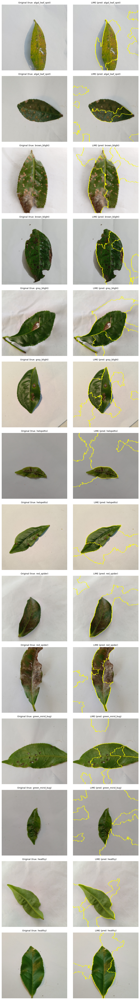


[OK] LIME explanations generated for 2 samples per class (14 total). Note: LIME is computationally expensive (num_samples perturbations per image), so this cell takes a while.


In [28]:
# ---- LIME (2 samples per class) ----
from lime import lime_image
from skimage.segmentation import mark_boundaries

def model_predict_fn(images_np):
    """LIME expects a function: numpy images (N,H,W,3) in [0,255] -> class probabilities."""
    batch = []
    for img in images_np:
        img_pil = Image.fromarray(img.astype("uint8"))
        tensor = get_eval_transform()(img_pil)
        batch.append(tensor)
    batch = torch.stack(batch).to(device)
    with torch.no_grad():
        logits = xai_model(batch)
        probs = F.softmax(logits, dim=1)
    return probs.cpu().numpy()


explainer = lime_image.LimeImageExplainer()

# Collect indices of 2 samples per class from the test set
SAMPLES_PER_CLASS = 2
class_to_indices = {c: [] for c in range(NUM_CLASSES)}
for i in range(len(test_ds)):
    _, lbl = test_ds[i]
    if len(class_to_indices[lbl]) < SAMPLES_PER_CLASS:
        class_to_indices[lbl].append(i)
    if all(len(v) >= SAMPLES_PER_CLASS for v in class_to_indices.values()):
        break

# One row per (class, sample): [original | LIME explanation]
total_rows = sum(len(v) for v in class_to_indices.values())
fig, axes = plt.subplots(total_rows, 2, figsize=(9, 4.2 * total_rows))
if total_rows == 1:
    axes = axes.reshape(1, 2)

row = 0
for class_idx in range(NUM_CLASSES):
    for sample_idx in class_to_indices[class_idx]:
        img_tensor, label = test_ds[sample_idx]
        rgb_img = (denormalize(img_tensor).permute(1, 2, 0).numpy() * 255).astype("uint8")

        explanation = explainer.explain_instance(
            rgb_img, model_predict_fn, top_labels=1, hide_color=0, num_samples=300
        )
        # LIME explains the model's TOP PREDICTED class (may differ from true label)
        explained_label = explanation.top_labels[0]
        temp, mask = explanation.get_image_and_mask(
            explained_label, positive_only=True, num_features=8, hide_rest=False
        )

        axes[row, 0].imshow(rgb_img)
        axes[row, 0].set_title(f"Original (true: {LABEL_LIST[label]})", fontsize=9)
        axes[row, 0].axis("off")
        axes[row, 1].imshow(mark_boundaries(temp / 255.0, mask))
        axes[row, 1].set_title(f"LIME (pred: {LABEL_LIST[explained_label]})", fontsize=9)
        axes[row, 1].axis("off")
        row += 1
    print(f"  LIME done for class: {LABEL_LIST[class_idx]}")

plt.tight_layout()
plt.savefig(f"{XAI_DIR}/lime_all_classes.png", dpi=300, bbox_inches="tight")
plt.show()

print(f"\n[OK] LIME explanations generated for {SAMPLES_PER_CLASS} samples per class "
      f"({total_rows} total). Note: LIME is computationally expensive "
      f"(num_samples perturbations per image), so this cell takes a while.")


Running SHAP on CPU for 7 images (one per class), nsamples=30 - this may take several minutes, do not interrupt.
[OK] SHAP computed for 7 images in 239.6s.


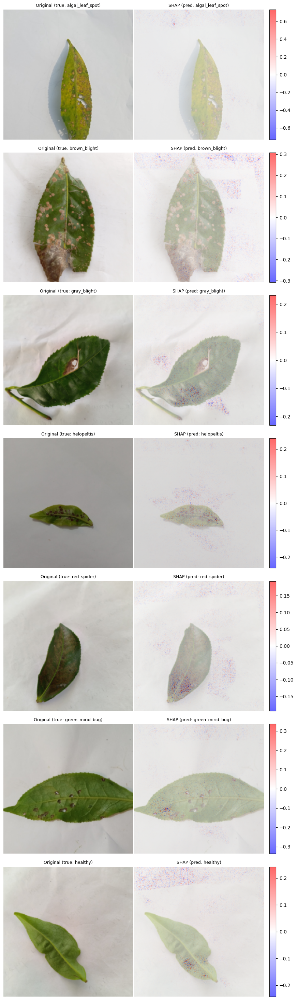

[OK] SHAP visualization (one per class) saved. Red = pushes toward predicted class, blue = away.


In [29]:
# ---- SHAP (GradientExplainer) - one sample per class, memory-safe (CPU) ----
import shap
import gc

# SHAP's GradientExplainer internally expands the batch by nsamples, which OOMs an
# 8GB GPU on this model. Run on CPU instead - slower but reliable.
SHAP_BACKGROUND_SIZE = 4
SHAP_NSAMPLES = 30          # lower = less memory + faster

gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

shap_device = torch.device("cpu")
shap_model = copy.deepcopy(xai_model).to(shap_device).eval()

# Background batch (reference distribution)
background_loader = DataLoader(train_ds, batch_size=SHAP_BACKGROUND_SIZE, shuffle=True)
background_batch, _ = next(iter(background_loader))
background_batch = background_batch.to(shap_device)

# Collect exactly ONE test sample per class
class_to_index = {}
for i in range(len(test_ds)):
    _, lbl = test_ds[i]
    if lbl not in class_to_index:
        class_to_index[lbl] = i
    if len(class_to_index) == NUM_CLASSES:
        break

ordered_indices = [class_to_index[c] for c in range(NUM_CLASSES) if c in class_to_index]
test_imgs = torch.stack([test_ds[idx][0] for idx in ordered_indices])
test_true_labels = [test_ds[idx][1] for idx in ordered_indices]
test_batch = test_imgs.to(shap_device)

print(f"Running SHAP on CPU for {test_batch.shape[0]} images (one per class), "
      f"nsamples={SHAP_NSAMPLES} - this may take several minutes, do not interrupt.")

t0 = time.time()
explainer_shap = shap.GradientExplainer(shap_model, background_batch)
shap_values = explainer_shap.shap_values(test_batch, nsamples=SHAP_NSAMPLES)
print(f"[OK] SHAP computed for {test_batch.shape[0]} images in {time.time()-t0:.1f}s.")

# ---- Visualization (works across SHAP versions) ----
def denorm_for_display(tensor):
    mean = torch.tensor(TEALEAF_MEAN).view(3, 1, 1)
    std = torch.tensor(TEALEAF_STD).view(3, 1, 1)
    return (tensor.cpu() * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()

if isinstance(shap_values, list):
    sv_list = [np.transpose(np.array(sv), (0, 2, 3, 1)) for sv in shap_values]
else:
    sv = np.array(shap_values)
    num_cls = sv.shape[-1]
    sv_list = [np.transpose(sv[..., k], (0, 2, 3, 1)) for k in range(num_cls)]

with torch.no_grad():
    pred_classes = shap_model(test_batch).argmax(dim=1).cpu().numpy()

n_imgs = test_batch.shape[0]
fig, axes = plt.subplots(n_imgs, 2, figsize=(9, 4.2 * n_imgs))
if n_imgs == 1:
    axes = axes.reshape(1, 2)

for i in range(n_imgs):
    orig = denorm_for_display(test_batch[i])
    pred_c = int(pred_classes[i])
    true_c = int(test_true_labels[i])
    shap_map = sv_list[pred_c][i].sum(axis=-1)
    limit = np.max(np.abs(shap_map)) + 1e-8

    axes[i, 0].imshow(orig)
    axes[i, 0].set_title(f"Original (true: {LABEL_LIST[true_c]})", fontsize=9)
    axes[i, 0].axis("off")
    axes[i, 1].imshow(orig)
    hm = axes[i, 1].imshow(shap_map, cmap="bwr", alpha=0.6, vmin=-limit, vmax=limit)
    axes[i, 1].set_title(f"SHAP (pred: {LABEL_LIST[pred_c]})", fontsize=9)
    axes[i, 1].axis("off")
    fig.colorbar(hm, ax=axes[i, 1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig(f"{XAI_DIR}/shap_all_classes.png", dpi=300, bbox_inches="tight")
plt.show()

del shap_model
gc.collect()
print("[OK] SHAP visualization (one per class) saved. "
      "Red = pushes toward predicted class, blue = away.")


Extracted 798 embeddings of dim 128
Silhouette score (higher = better separated classes): 0.7821


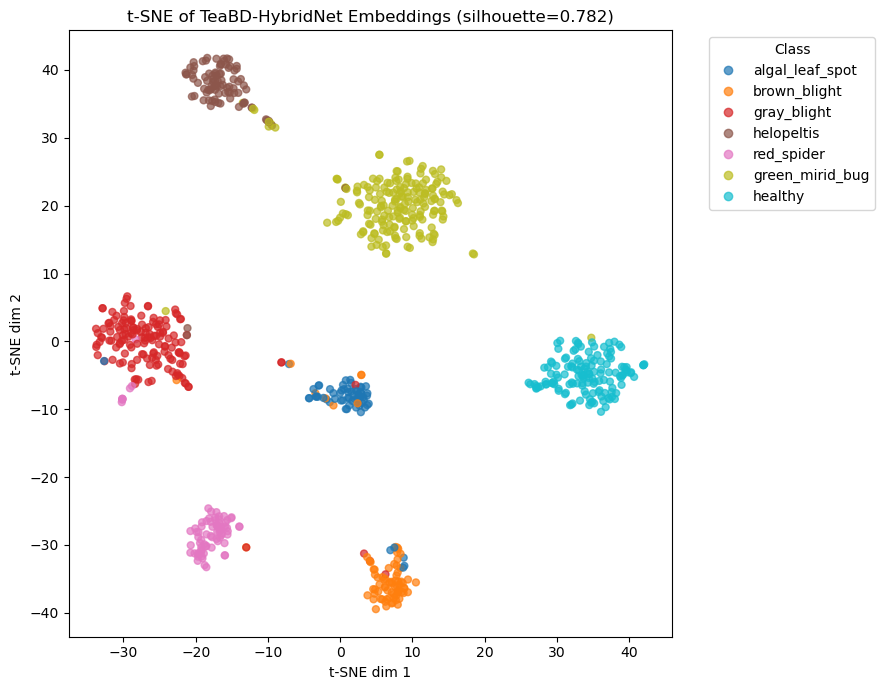

In [30]:
# ---- t-SNE on learned embeddings ----
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

@torch.no_grad()
def extract_embeddings(model, loader, device):
    model.eval()
    all_feats, all_labels = [], []
    for images, labels in loader:
        images = images.to(device)
        _, feats = model(images, return_features=True)
        all_feats.append(feats.cpu().numpy())
        all_labels.extend(labels.numpy())
    return np.concatenate(all_feats, axis=0), np.array(all_labels)


embeddings, emb_labels = extract_embeddings(xai_model, test_loader, device)
print(f"Extracted {embeddings.shape[0]} embeddings of dim {embeddings.shape[1]}")

tsne = TSNE(n_components=2, random_state=SEED, perplexity=min(30, len(embeddings) - 1))
emb_2d = tsne.fit_transform(embeddings)

sil_score = silhouette_score(embeddings, emb_labels) if len(set(emb_labels)) > 1 else float("nan")
print(f"Silhouette score (higher = better separated classes): {sil_score:.4f}")

plt.figure(figsize=(9, 7))
scatter = plt.scatter(emb_2d[:, 0], emb_2d[:, 1], c=emb_labels, cmap="tab10", alpha=0.7, s=25)
handles, _ = scatter.legend_elements()
plt.legend(handles, LABEL_LIST, title="Class", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.title(f"t-SNE of TeaBD-HybridNet Embeddings (silhouette={sil_score:.3f})")
plt.xlabel("t-SNE dim 1"); plt.ylabel("t-SNE dim 2")
plt.tight_layout()
plt.savefig(f"{XAI_DIR}/tsne_embeddings.png", dpi=300, bbox_inches="tight")
plt.show()


## 17. Adversarial Robustness Evaluation

Evaluates TeaBD-HybridNet against:
- **White-box attacks**: FGSM, PGD-20, CW-L2 at multiple perturbation budgets (epsilon)
- **Real-world corruptions**: Gaussian noise, motion blur, brightness/contrast shift, JPEG compression at 5 severity levels
- **Defense**: PGD adversarial training + re-evaluation

Install if needed: `pip install torchattacks --break-system-packages`

In [31]:
import torchattacks

robust_model = xai_model  # reuse the loaded best TeaBD-HybridNet from Section 15
robust_model.eval()

@torch.no_grad()
def clean_accuracy(model, loader, device):
    model.eval()
    correct, total = 0, 0
    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)
        preds = model(images).argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return correct / total


def adversarial_accuracy(model, loader, attack, device, max_batches=None):
    model.eval()
    correct, total = 0, 0
    for i, (images, labels) in enumerate(loader):
        if max_batches is not None and i >= max_batches:
            break
        images, labels = images.to(device), labels.to(device)
        adv_images = attack(images, labels)
        with torch.no_grad():
            preds = model(adv_images).argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return correct / total


clean_acc = clean_accuracy(robust_model, test_loader, device)
print(f"Clean test accuracy: {clean_acc:.4f}")


Clean test accuracy: 0.9511


In [42]:


# White-box attacks at multiple epsilon budgets

import gc, os
 
# ---- 0) Free GPU memory held by earlier sections (SHAP, baselines, embeddings) ----

for _name in ["model_b", "baseline_xai_model", "curves_model", "explainer",

              "shap_values", "background", "background_loader", "embeddings"]:

    if _name in globals():

        try:

            obj = globals()[_name]

            if hasattr(obj, "cpu"):

                obj.cpu()

        except Exception:

            pass

        del globals()[_name]
 
gc.collect()

torch.cuda.empty_cache()

torch.cuda.ipc_collect()

print(f"GPU allocated after cleanup: {torch.cuda.memory_allocated()/1e9:.2f} GB "

      f"/ reserved: {torch.cuda.memory_reserved()/1e9:.2f} GB")
 
# ---- 1) Small-batch loader just for adversarial eval ----

ATTACK_BATCH_SIZE = 4

attack_loader = DataLoader(test_ds, batch_size=ATTACK_BATCH_SIZE, shuffle=False,

                           num_workers=2, pin_memory=True)
 
# ---- 2) Memory-safe adversarial accuracy (frees per batch, auto-retries on OOM) ----

def adversarial_accuracy_safe(model, loader, attack_fn, device, max_batches=None):

    model.eval()

    correct, total = 0, 0

    for i, (images, labels) in enumerate(loader):

        if max_batches is not None and i >= max_batches:

            break

        try:

            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            adv_images = attack_fn(images, labels)

            with torch.no_grad():

                preds = model(adv_images).argmax(dim=1)

            correct += (preds == labels).sum().item()

            total += labels.size(0)

            del images, labels, adv_images, preds

        except torch.cuda.OutOfMemoryError:

            # split this batch into single samples and retry

            torch.cuda.empty_cache(); gc.collect()

            for j in range(images.size(0)):

                img = images[j:j+1].to(device)

                lbl = labels[j:j+1].to(device)

                adv = attack_fn(img, lbl)

                with torch.no_grad():

                    p = model(adv).argmax(dim=1)

                correct += (p == lbl).sum().item()

                total += 1

                del img, lbl, adv, p

                torch.cuda.empty_cache()

        if i % 20 == 0:

            torch.cuda.empty_cache()

    torch.cuda.empty_cache(); gc.collect()

    return correct / max(total, 1)
 
# keep the old name working for later cells (adversarial training recovery section)

adversarial_accuracy = lambda model, loader, attack, device, max_batches=None: \
adversarial_accuracy_safe(model, attack_loader, attack, device, max_batches)
 
EPSILONS = [2/255, 4/255, 8/255]

MAX_BATCHES = None  # limit for speed; None = full test set
 
robustness_results = [{"attack": "clean", "epsilon": 0.0, "accuracy": clean_acc}]
 
for eps in EPSILONS:

    fgsm = torchattacks.FGSM(robust_model, eps=eps)

    acc = adversarial_accuracy_safe(robust_model, attack_loader, fgsm, device, max_batches=MAX_BATCHES)

    robustness_results.append({"attack": "FGSM", "epsilon": eps, "accuracy": acc})

    print(f"FGSM  eps={eps:.4f} ({eps*255:.0f}/255): accuracy={acc:.4f}")

    del fgsm; gc.collect(); torch.cuda.empty_cache()
 
    pgd = torchattacks.PGD(robust_model, eps=eps, alpha=eps/4, steps=20)

    acc = adversarial_accuracy_safe(robust_model, attack_loader, pgd, device, max_batches=MAX_BATCHES)

    robustness_results.append({"attack": "PGD-20", "epsilon": eps, "accuracy": acc})

    print(f"PGD-20 eps={eps:.4f} ({eps*255:.0f}/255): accuracy={acc:.4f}")

    del pgd; gc.collect(); torch.cuda.empty_cache()
 
cw = torchattacks.CW(robust_model, c=1, steps=50)

acc = adversarial_accuracy_safe(robust_model, attack_loader, cw, device, max_batches=MAX_BATCHES)

robustness_results.append({"attack": "CW-L2", "epsilon": None, "accuracy": acc})

print(f"CW-L2: accuracy={acc:.4f}")

del cw; gc.collect(); torch.cuda.empty_cache()
 
robustness_df = pd.DataFrame(robustness_results)

robustness_df.to_csv(f"{ROBUSTNESS_DIR}/robustness_results.csv", index=False)

robustness_df
 

# # White-box attacks at multiple epsilon budgets
# EPSILONS = [2/255, 4/255, 8/255]
# MAX_BATCHES = None #None  # limit for speed; increase for the final paper run

# robustness_results = [{"attack": "clean", "epsilon": 0.0, "accuracy": clean_acc}]

# for eps in EPSILONS:
#     fgsm = torchattacks.FGSM(robust_model, eps=eps)
#     acc = adversarial_accuracy(robust_model, test_loader, fgsm, device, max_batches=MAX_BATCHES)
#     robustness_results.append({"attack": "FGSM", "epsilon": eps, "accuracy": acc})
#     print(f"FGSM  eps={eps:.4f} ({eps*255:.0f}/255): accuracy={acc:.4f}")

#     pgd = torchattacks.PGD(robust_model, eps=eps, alpha=eps/4, steps=20)
#     acc = adversarial_accuracy(robust_model, test_loader, pgd, device, max_batches=MAX_BATCHES)
#     robustness_results.append({"attack": "PGD-20", "epsilon": eps, "accuracy": acc})
#     print(f"PGD-20 eps={eps:.4f} ({eps*255:.0f}/255): accuracy={acc:.4f}")

# cw = torchattacks.CW(robust_model, c=1, steps=50)
# acc = adversarial_accuracy(robust_model, test_loader, cw, device, max_batches=MAX_BATCHES)
# robustness_results.append({"attack": "CW-L2", "epsilon": None, "accuracy": acc})
# print(f"CW-L2: accuracy={acc:.4f}")

# robustness_df = pd.DataFrame(robustness_results)
# robustness_df.to_csv(f"{ROBUSTNESS_DIR}/robustness_results.csv", index=False)
# robustness_df


GPU allocated after cleanup: 4.10 GB / reserved: 4.35 GB
FGSM  eps=0.0078 (2/255): accuracy=0.3133
PGD-20 eps=0.0078 (2/255): accuracy=0.0163
FGSM  eps=0.0157 (4/255): accuracy=0.3033
PGD-20 eps=0.0157 (4/255): accuracy=0.0150
FGSM  eps=0.0314 (8/255): accuracy=0.2945
PGD-20 eps=0.0314 (8/255): accuracy=0.0150
CW-L2: accuracy=0.0163


,attack,epsilon,accuracy
0,clean,0.000000,0.951128
1,FGSM,0.007843,0.313283
2,PGD-20,0.007843,0.016291
3,FGSM,0.015686,0.303258
4,PGD-20,0.015686,0.015038
5,FGSM,0.031373,0.294486
6,PGD-20,0.031373,0.015038
7,CW-L2,NaN,0.016291


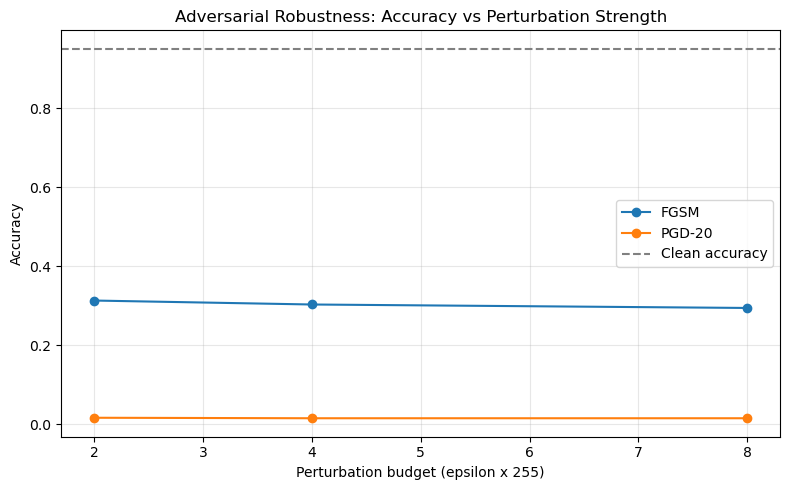

In [43]:
# Accuracy-vs-epsilon degradation curve
fig, ax = plt.subplots(figsize=(8, 5))
for attack_name in ["FGSM", "PGD-20"]:
    subset = robustness_df[robustness_df["attack"] == attack_name]
    ax.plot(subset["epsilon"] * 255, subset["accuracy"], marker="o", label=attack_name)
ax.axhline(clean_acc, color="gray", linestyle="--", label="Clean accuracy")
ax.set_xlabel("Perturbation budget (epsilon x 255)")
ax.set_ylabel("Accuracy")
ax.set_title("Adversarial Robustness: Accuracy vs Perturbation Strength")
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(f"{ROBUSTNESS_DIR}/adversarial_degradation_curve.png", dpi=300, bbox_inches="tight")
plt.show()


In [44]:
# ---- Real-world corruption robustness ----
import numpy as np
from PIL import ImageFilter, ImageEnhance
import io

def apply_corruption(img_pil, corruption_type, severity):
    """severity: 1 (mild) to 5 (severe)"""
    if corruption_type == "gaussian_noise":
        arr = np.array(img_pil).astype(np.float32)
        sigma = [5, 10, 15, 20, 25][severity - 1]
        noise = np.random.normal(0, sigma, arr.shape)
        arr = np.clip(arr + noise, 0, 255).astype(np.uint8)
        return Image.fromarray(arr)
    elif corruption_type == "motion_blur":
        radius = [1, 2, 3, 4, 5][severity - 1]
        return img_pil.filter(ImageFilter.GaussianBlur(radius=radius))
    elif corruption_type == "brightness":
        factor = [1.2, 1.4, 1.6, 1.8, 2.0][severity - 1]
        return ImageEnhance.Brightness(img_pil).enhance(factor)
    elif corruption_type == "contrast":
        factor = [0.8, 0.6, 0.4, 0.3, 0.2][severity - 1]
        return ImageEnhance.Contrast(img_pil).enhance(factor)
    elif corruption_type == "jpeg_compression":
        quality = [80, 60, 40, 20, 10][severity - 1]
        buf = io.BytesIO()
        img_pil.save(buf, format="JPEG", quality=quality)
        buf.seek(0)
        return Image.open(buf).convert("RGB")
    else:
        raise ValueError(corruption_type)


class CorruptedTeaLeafDataset(Dataset):
    """Wraps the test CSV, applies a corruption before the standard eval transform."""
    def __init__(self, csv_path, corruption_type, severity, base_transform):
        self.base = TeaLeafBDDataset(csv_path, transform=None)
        self.corruption_type = corruption_type
        self.severity = severity
        self.base_transform = base_transform

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        filepath, label_idx, _ = self.base.samples[idx]
        img = Image.open(filepath).convert("RGB")
        img = apply_corruption(img, self.corruption_type, self.severity)
        img = self.base_transform(img)
        return img, label_idx


CORRUPTION_TYPES = ["gaussian_noise", "motion_blur", "brightness", "contrast", "jpeg_compression"]
SEVERITIES = [1, 2, 3, 4, 5]

corruption_results = []
for ctype in CORRUPTION_TYPES:
    for sev in SEVERITIES:
        corrupt_ds = CorruptedTeaLeafDataset(f"{SPLITS_DIR}/test.csv", ctype, sev, get_eval_transform())
        corrupt_loader = DataLoader(corrupt_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
        acc = clean_accuracy(robust_model, corrupt_loader, device)
        corruption_results.append({"corruption": ctype, "severity": sev, "accuracy": acc})
        print(f"{ctype:20s} severity={sev}: accuracy={acc:.4f}")

corruption_df = pd.DataFrame(corruption_results)
corruption_df.to_csv(f"{ROBUSTNESS_DIR}/corruption_results.csv", index=False)


gaussian_noise       severity=1: accuracy=0.9536
gaussian_noise       severity=2: accuracy=0.9461
gaussian_noise       severity=3: accuracy=0.9461
gaussian_noise       severity=4: accuracy=0.9424
gaussian_noise       severity=5: accuracy=0.9298
motion_blur          severity=1: accuracy=0.9511
motion_blur          severity=2: accuracy=0.9411
motion_blur          severity=3: accuracy=0.9386
motion_blur          severity=4: accuracy=0.9273
motion_blur          severity=5: accuracy=0.9085
brightness           severity=1: accuracy=0.9511
brightness           severity=2: accuracy=0.9398
brightness           severity=3: accuracy=0.9411
brightness           severity=4: accuracy=0.9336
brightness           severity=5: accuracy=0.9336
contrast             severity=1: accuracy=0.9499
contrast             severity=2: accuracy=0.9486
contrast             severity=3: accuracy=0.9461
contrast             severity=4: accuracy=0.9411
contrast             severity=5: accuracy=0.9398
jpeg_compression    

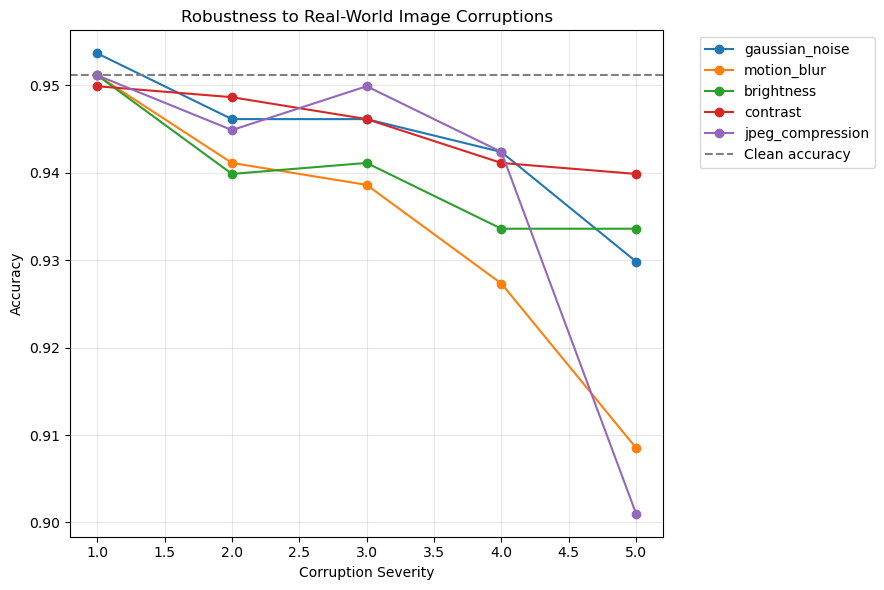

In [45]:
# Corruption degradation curves
fig, ax = plt.subplots(figsize=(9, 6))
for ctype in CORRUPTION_TYPES:
    subset = corruption_df[corruption_df["corruption"] == ctype]
    ax.plot(subset["severity"], subset["accuracy"], marker="o", label=ctype)
ax.axhline(clean_acc, color="gray", linestyle="--", label="Clean accuracy")
ax.set_xlabel("Corruption Severity")
ax.set_ylabel("Accuracy")
ax.set_title("Robustness to Real-World Image Corruptions")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(f"{ROBUSTNESS_DIR}/corruption_degradation_curve.png", dpi=300, bbox_inches="tight")
plt.show()


In [52]:
# ---- Defense: PGD Adversarial Training (memory-safe, early-stopped) ----
import gc

# ---- 0) Free GPU memory held by earlier sections before building a new model ----
for _name in ["curves_model", "shap_model", "shap_baseline_model",
              "baseline_xai_model", "swa_model", "profiling_copy", "model_b"]:
    if _name in globals():
        obj = globals()[_name]
        try:
            if hasattr(obj, "cpu"):
                obj.cpu()
        except Exception:
            pass
        del globals()[_name]

gc.collect()
torch.cuda.empty_cache()
torch.cuda.ipc_collect()
print(f"GPU allocated before adv training: {torch.cuda.memory_allocated()/1e9:.2f} GB "
      f"/ reserved: {torch.cuda.memory_reserved()/1e9:.2f} GB")

# ---- 1) Small-batch loader just for adversarial fine-tuning ----
ADV_TRAIN_BATCH_SIZE = 2   # drop to 2 if this still OOMs
adv_train_loader = DataLoader(train_ds, batch_size=ADV_TRAIN_BATCH_SIZE, shuffle=True,
                               num_workers=2, pin_memory=True, drop_last=True)

# ---- 2) Memory-safe training epoch with periodic cache clearing + OOM retry ----
def train_one_epoch_adversarial(model, loader, optimizer, criterion, device, attack,
                                 clean_ratio=0.5, grad_clip=1.0, empty_cache_every=20):
    """Mixes clean and PGD-adversarial examples in each batch (PGD-AT).
    Frees GPU memory periodically and retries a batch at micro-batch size 1
    if it OOMs, instead of crashing the whole fine-tuning run."""
    model.train()
    running_loss, n_seen = 0.0, 0

    for i, (images, labels) in enumerate(loader):
        try:
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            split = int(images.size(0) * clean_ratio)

            clean_part = images[:split]
            adv_part = attack(images[split:], labels[split:]) if split < images.size(0) else images[:0]
            combined = torch.cat([clean_part, adv_part], dim=0)

            optimizer.zero_grad()
            outputs = model(combined)
            loss = criterion(outputs, labels)
            loss.backward()
            if grad_clip is not None:
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=grad_clip)
            optimizer.step()

            running_loss += loss.item() * combined.size(0)
            n_seen += combined.size(0)

            del images, labels, clean_part, adv_part, combined, outputs, loss

        except torch.cuda.OutOfMemoryError:
            torch.cuda.empty_cache(); gc.collect()
            print(f"  [WARNING] OOM on batch {i}, retrying at micro-batch size 1")
            for j in range(images.size(0)):
                img = images[j:j+1].to(device)
                lbl = labels[j:j+1].to(device)
                is_adv = j >= split
                x = attack(img, lbl) if is_adv else img

                optimizer.zero_grad()
                out = model(x)
                l = criterion(out, lbl)
                l.backward()
                if grad_clip is not None:
                    torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=grad_clip)
                optimizer.step()

                running_loss += l.item()
                n_seen += 1
                del img, lbl, x, out, l
                torch.cuda.empty_cache()

        if i % empty_cache_every == 0:
            torch.cuda.empty_cache()

    torch.cuda.empty_cache(); gc.collect()
    return running_loss / max(n_seen, 1)


# ---- 3) Build the fine-tune model fresh, straight after cleanup ----
adv_trained_model = TeaBDHybridNet(num_classes=NUM_CLASSES, pretrained=False, use_fusion=False).to(device)
adv_trained_model.load_state_dict(xai_ckpt["model_state_dict"])

adv_optimizer = torch.optim.AdamW(adv_trained_model.parameters(), lr=1e-5, weight_decay=WEIGHT_DECAY)
adv_criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)
adv_attack = torchattacks.PGD(adv_trained_model, eps=4/255, alpha=1/255, steps=10)
adv_attack_val = torchattacks.PGD(adv_trained_model, eps=4/255, alpha=(4/255)/4, steps=5)  # cheaper monitor attack

# ---- 4) Early-stopped fine-tuning loop, tracking robust val accuracy ----
ADV_TRAIN_EPOCHS = 30
ADV_PATIENCE = 8

# Small-batch loader dedicated to the robustness check inside the loop —
# reuses val_ds but at the same tight batch size as training, to avoid the
# OOM you hit when val_loader (batch 16) ran PGD-10 right after a training epoch.
VAL_CHECK_BATCH_SIZE = ADV_TRAIN_BATCH_SIZE  # 4 (or 2 if still tight)
val_check_loader = DataLoader(val_ds, batch_size=VAL_CHECK_BATCH_SIZE, shuffle=False,
                               num_workers=2, pin_memory=True)

best_adv_val_acc = 0.0
epochs_no_improve = 0
adv_train_history = {"epoch": [], "train_loss": [], "val_clean_acc": [], "val_robust_acc": []}

best_adv_ckpt_path = f"{CHECKPOINT_DIR}/teabd_hybridnet_adv_trained_best.pt"

for epoch in range(ADV_TRAIN_EPOCHS):
    loss = train_one_epoch_adversarial(adv_trained_model, adv_train_loader, adv_optimizer,
                                        adv_criterion, device, adv_attack)

    # ---- free memory before the validation check — training just finished
    # holding gradients/optimizer state, GPU is at its tightest here ----
    torch.cuda.empty_cache(); gc.collect()

    # ---- robustness check, wrapped so a transient OOM doesn't kill the run ----
    try:
        val_robust_acc = adversarial_accuracy_safe(adv_trained_model, val_check_loader,
                                                     adv_attack_val, device, max_batches=10)
    except torch.cuda.OutOfMemoryError:
        print(f"  [WARNING] OOM during val robustness check at epoch {epoch+1}, "
              f"skipping this epoch's robust-acc measurement.")
        torch.cuda.empty_cache(); gc.collect()
        val_robust_acc = adv_train_history["val_robust_acc"][-1] if adv_train_history["val_robust_acc"] else 0.0

    torch.cuda.empty_cache(); gc.collect()

    try:
        val_clean_acc = clean_accuracy(adv_trained_model, val_check_loader, device)
    except torch.cuda.OutOfMemoryError:
        torch.cuda.empty_cache(); gc.collect()
        val_clean_acc = adv_train_history["val_clean_acc"][-1] if adv_train_history["val_clean_acc"] else 0.0

    adv_train_history["epoch"].append(epoch + 1)
    adv_train_history["train_loss"].append(loss)
    adv_train_history["val_clean_acc"].append(val_clean_acc)
    adv_train_history["val_robust_acc"].append(val_robust_acc)

    print(f"Epoch {epoch+1:2d}/{ADV_TRAIN_EPOCHS} | loss={loss:.4f} "
          f"| val_clean={val_clean_acc:.4f} | val_robust={val_robust_acc:.4f}")

    if val_robust_acc > best_adv_val_acc:
        best_adv_val_acc = val_robust_acc
        epochs_no_improve = 0
        atomic_save({"model_state_dict": adv_trained_model.state_dict(),
                     "epoch": epoch,
                     "val_robust_acc": val_robust_acc,
                     "val_clean_acc": val_clean_acc}, best_adv_ckpt_path)
        print(f"  -> New best robust val acc: {val_robust_acc:.4f}, checkpoint saved.")
    else:
        epochs_no_improve += 1

    torch.cuda.empty_cache(); gc.collect()

    if epochs_no_improve >= ADV_PATIENCE:
        print(f"Adversarial fine-tuning early-stopped at epoch {epoch+1} "
              f"(best val_robust_acc={best_adv_val_acc:.4f})")
        break

# save training history alongside the other JSON histories
with open(f"{HISTORY_DIR}/teabd_hybridnet_adv_trained_history.json", "w") as f:
    json.dump(adv_train_history, f, indent=2)

# ---- 5) Load back the best-checkpoint weights before downstream evaluation ----
best_adv_ckpt, _ = safe_load_checkpoint(best_adv_ckpt_path, map_location=device)
if best_adv_ckpt is not None:
    adv_trained_model.load_state_dict(best_adv_ckpt["model_state_dict"])
    print(f"[OK] Loaded best adversarially fine-tuned checkpoint "
          f"(val_robust_acc={best_adv_ckpt.get('val_robust_acc', float('nan')):.4f}).")

# also save under the original filename so downstream cells (Section 17's
# recovery evaluation) that expect this exact path keep working unmodified
atomic_save({"model_state_dict": adv_trained_model.state_dict()},
            f"{CHECKPOINT_DIR}/teabd_hybridnet_adv_trained.pt")
print("[OK] Adversarially fine-tuned model saved.")

GPU allocated before adv training: 5.27 GB / reserved: 6.19 GB
[OK] PretrainedCNNBranch: convnext_tiny (768 ch) -> 384 ch
Epoch  1/30 | loss=1.7090 | val_clean=0.8682 | val_robust=0.0500
  -> New best robust val acc: 0.0500, checkpoint saved.
Epoch  2/30 | loss=1.6888 | val_clean=0.9341 | val_robust=0.2000
  -> New best robust val acc: 0.2000, checkpoint saved.
Epoch  3/30 | loss=1.7881 | val_clean=0.8035 | val_robust=0.1500
Epoch  4/30 | loss=1.7268 | val_clean=0.8910 | val_robust=0.2000
Epoch  5/30 | loss=1.6974 | val_clean=0.8226 | val_robust=0.1000
Epoch  6/30 | loss=1.7478 | val_clean=0.7833 | val_robust=0.2000
Epoch  7/30 | loss=1.7017 | val_clean=0.8542 | val_robust=0.1000
Epoch  8/30 | loss=1.7062 | val_clean=0.8492 | val_robust=0.2000
Epoch  9/30 | loss=1.6856 | val_clean=0.7364 | val_robust=0.1000
Epoch 10/30 | loss=1.6918 | val_clean=0.8847 | val_robust=0.1500
Adversarial fine-tuning early-stopped at epoch 10 (best val_robust_acc=0.2000)
[OK] Loaded verified checkpoint: chec

In [53]:
torch.cuda.empty_cache(); gc.collect()

# Re-evaluate the adversarially trained model to confirm robustness recovery
adv_clean_acc = clean_accuracy(adv_trained_model, test_loader, device)
print(f"Adversarially-trained model - clean accuracy: {adv_clean_acc:.4f} "
      f"(original: {clean_acc:.4f})")

recovery_results = []
for eps in EPSILONS:
    pgd_eval = torchattacks.PGD(adv_trained_model, eps=eps, alpha=eps/4, steps=20)
    acc_before = robustness_df[(robustness_df.attack == "PGD-20") & (robustness_df.epsilon == eps)]["accuracy"].values[0]
    acc_after = adversarial_accuracy(adv_trained_model, test_loader, pgd_eval, device, max_batches=MAX_BATCHES)
    recovery_results.append({"epsilon": eps, "pgd_acc_before_defense": acc_before, "pgd_acc_after_defense": acc_after})
    print(f"eps={eps*255:.0f}/255: PGD acc before defense={acc_before:.4f}, after defense={acc_after:.4f}")

recovery_df = pd.DataFrame(recovery_results)
recovery_df.to_csv(f"{ROBUSTNESS_DIR}/adversarial_training_recovery.csv", index=False)
recovery_df


Adversarially-trained model - clean accuracy: 0.8922 (original: 0.9511)
eps=2/255: PGD acc before defense=0.0163, after defense=0.2419
eps=4/255: PGD acc before defense=0.0150, after defense=0.2419
eps=8/255: PGD acc before defense=0.0150, after defense=0.2393


,epsilon,pgd_acc_before_defense,pgd_acc_after_defense
0,0.007843,0.016291,0.241855
1,0.015686,0.015038,0.241855
2,0.031373,0.015038,0.239348


## 18. Final Results Compilation

Consolidates all experimental results into publication-ready tables and figures.
Run this section **after** all previous sections (8–16) have completed.
All outputs saved at 300 DPI under `./results/`.

RESULTS DIRECTORY CONTENTS
  figures                                                     4.0 KB
  history                                                     4.0 KB
  robustness                                                  4.0 KB
  tables                                                      4.0 KB
  xai                                                         4.0 KB

Total files: 5
[OK] Loaded verified checkpoint: checkpoints/teabd_hybridnet_best.pt
[OK] PretrainedCNNBranch: convnext_tiny (768 ch) -> 384 ch

TABLE 1: MASTER MODEL COMPARISON (sorted by Test Macro-F1)
                       Model      Type  Params (M) FLOPs (G) Inference (ms)  Test Acc  Test F1
Rank                                                                                          
1     TeaBD-HybridNet (ours)  Proposed       49.88         -              -    0.9511   0.9417
2                  swin_tiny  Baseline       27.52      4.37            9.9    0.9461   0.9352
3                mobilevit_s  Baseline      

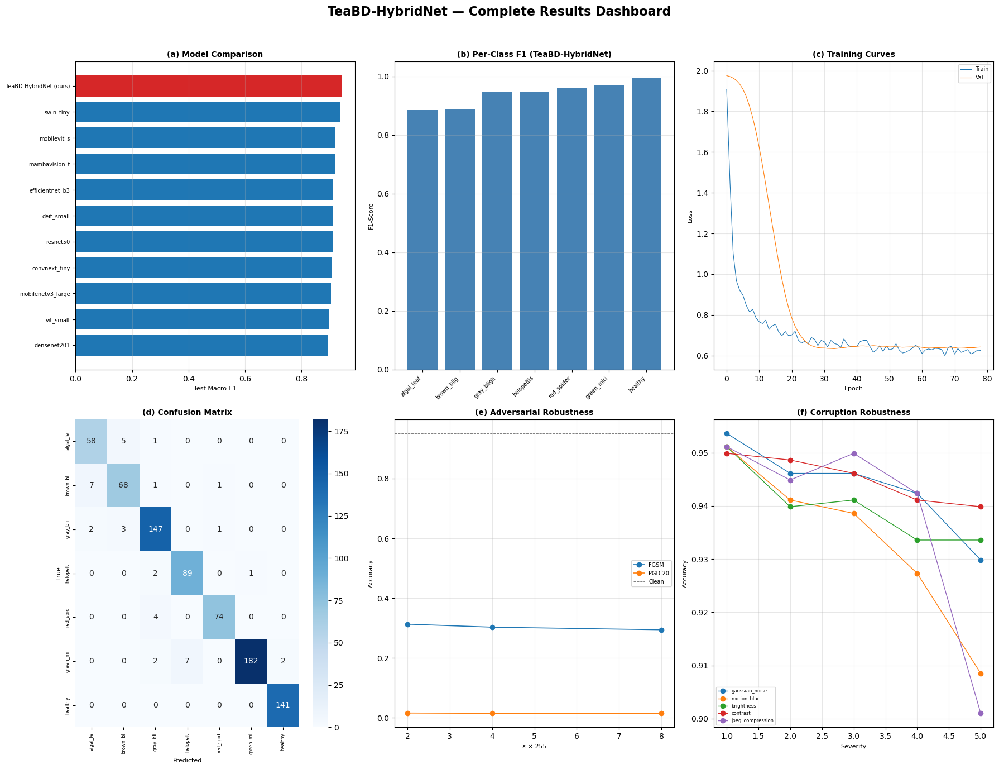


Dashboard saved: ./results/complete_results_dashboard.png


In [54]:
# %% [markdown]
# ## 18. Final Results Compilation

import glob

print("=" * 80)
print("RESULTS DIRECTORY CONTENTS")
print("=" * 80)
result_files = sorted(glob.glob(f"{RESULTS_DIR}/*"))
for f in result_files:
    size_kb = os.path.getsize(f) / 1024
    ext = os.path.splitext(f)[1]
    print(f"  {os.path.basename(f):45s}  {ext:6s}  {size_kb:8.1f} KB")
print(f"\nTotal files: {len(result_files)}")


# %%
# ---- Table 1: Master Model Comparison — baselines + TeaBD-HybridNet ----
rows = []

try:
    bl_df = pd.read_csv(f"{TABLES_DIR}/baseline_results.csv")
    for _, r in bl_df.iterrows():
        rows.append({
            "Model": r["model"],
            "Type": "Baseline",
            "Params (M)": round(r["params_M"], 2),
            "FLOPs (G)": round(r["flops_G"], 2) if pd.notna(r.get("flops_G")) else "-",
            "Inference (ms)": round(r["inference_ms"], 1) if pd.notna(r.get("inference_ms")) else "-",
            "Test Acc": round(r["test_acc"], 4),
            "Test F1": round(r["test_f1"], 4),
        })
except FileNotFoundError:
    print("[INFO] baseline_results.csv not found - skipping baselines.")

# TeaBD-HybridNet row (added explicitly — it's the proposed model, not a baseline)
try:
    hn_ckpt, _ = safe_load_checkpoint(f"{CHECKPOINT_DIR}/teabd_hybridnet_best.pt", map_location="cpu")
    if hn_ckpt is not None:
        m = TeaBDHybridNet(num_classes=NUM_CLASSES, pretrained=False, use_fusion=False)
        m.load_state_dict(hn_ckpt["model_state_dict"])
        m.to(device).eval()
        _, _, hn_f1, hn_preds, hn_labels = evaluate(m, test_loader, nn.CrossEntropyLoss(), device)
        hn_acc = accuracy_score(hn_labels, hn_preds)
        hn_params = sum(p.numel() for p in m.parameters()) / 1e6
        rows.append({
            "Model": "TeaBD-HybridNet (ours)",
            "Type": "Proposed",
            "Params (M)": round(hn_params, 2),
            "FLOPs (G)": "-",
            "Inference (ms)": "-",
            "Test Acc": round(hn_acc, 4),
            "Test F1": round(hn_f1, 4),
        })
except Exception as e:
    print(f"[INFO] Could not load TeaBD-HybridNet results: {e}")

if rows:
    master_df = pd.DataFrame(rows)
    master_df = master_df.sort_values("Test F1", ascending=False).reset_index(drop=True)
    master_df.index += 1
    master_df.index.name = "Rank"
    master_df.to_csv(f"{TABLES_DIR}/master_model_comparison.csv")

    print("\n" + "=" * 80)
    print("TABLE 1: MASTER MODEL COMPARISON (sorted by Test Macro-F1)")
    print("=" * 80)
    print(master_df.to_string())
    print()
else:
    print("[WARNING] No model results found.")
    master_df = pd.DataFrame()


# %%
# ---- Table 2: Per-Class Performance of TeaBD-HybridNet ----
try:
    if "hn_preds" in dir() and "hn_labels" in dir():
        per_class_p = precision_score(hn_labels, hn_preds, average=None, labels=range(NUM_CLASSES), zero_division=0)
        per_class_r = recall_score(hn_labels, hn_preds, average=None, labels=range(NUM_CLASSES), zero_division=0)
        per_class_f = f1_score(hn_labels, hn_preds, average=None, labels=range(NUM_CLASSES), zero_division=0)
        support = [list(hn_labels).count(i) for i in range(NUM_CLASSES)]

        perclass_df = pd.DataFrame({
            "Class": LABEL_LIST,
            "Support": support,
            "Precision": [round(x, 4) for x in per_class_p],
            "Recall": [round(x, 4) for x in per_class_r],
            "F1-Score": [round(x, 4) for x in per_class_f],
        })
        macro_row = pd.DataFrame([{
            "Class": "Macro Avg", "Support": sum(support),
            "Precision": round(per_class_p.mean(), 4),
            "Recall": round(per_class_r.mean(), 4),
            "F1-Score": round(per_class_f.mean(), 4),
        }])
        weighted_row = pd.DataFrame([{
            "Class": "Weighted Avg", "Support": sum(support),
            "Precision": round(precision_score(hn_labels, hn_preds, average="weighted", zero_division=0), 4),
            "Recall": round(recall_score(hn_labels, hn_preds, average="weighted", zero_division=0), 4),
            "F1-Score": round(f1_score(hn_labels, hn_preds, average="weighted", zero_division=0), 4),
        }])
        perclass_df = pd.concat([perclass_df, macro_row, weighted_row], ignore_index=True)
        perclass_df.to_csv(f"{TABLES_DIR}/per_class_performance.csv", index=False)

        print("\n" + "=" * 80)
        print("TABLE 2: PER-CLASS PERFORMANCE — TeaBD-HybridNet (Test Set)")
        print("=" * 80)
        print(perclass_df.to_string(index=False))
    else:
        print("[INFO] Run Section 18's Table 1 cell first to generate hn_preds/hn_labels.")
except Exception as e:
    print(f"[INFO] Per-class table error: {e}")


# %%
# ---- Table 3/4/5: Adversarial + corruption robustness — UNCHANGED, reads CSVs
# from ROBUSTNESS_DIR as before ----

try:
    rob_df = pd.read_csv(f"{ROBUSTNESS_DIR}/robustness_results.csv")
    print("\n" + "=" * 80)
    print("TABLE 3: ADVERSARIAL ROBUSTNESS")
    print("=" * 80)
    rob_display = rob_df.copy()
    rob_display["epsilon"] = rob_display["epsilon"].apply(
        lambda x: f"{x*255:.0f}/255" if pd.notna(x) and x > 0 else ("0 (clean)" if x == 0 else "-"))
    rob_display["accuracy"] = rob_display["accuracy"].round(4)
    print(rob_display.to_string(index=False))
except FileNotFoundError:
    print("[INFO] robustness_results.csv not found - run Section 17 first.")

try:
    corr_df = pd.read_csv(f"{ROBUSTNESS_DIR}/corruption_results.csv")
    corr_pivot = corr_df.pivot(index="corruption", columns="severity", values="accuracy").round(4)
    corr_pivot.columns = [f"Severity {c}" for c in corr_pivot.columns]
    corr_pivot.to_csv(f"{TABLES_DIR}/corruption_pivot_table.csv")
    print("\n" + "=" * 80)
    print("TABLE 4: CORRUPTION ROBUSTNESS")
    print("=" * 80)
    print(corr_pivot.to_string())
except FileNotFoundError:
    print("[INFO] corruption_results.csv not found - run Section 17 first.")

try:
    recovery_df = pd.read_csv(f"{ROBUSTNESS_DIR}/adversarial_training_recovery.csv")
    recovery_display = recovery_df.copy()
    recovery_display["epsilon"] = recovery_display["epsilon"].apply(lambda x: f"{x*255:.0f}/255")
    for col in ["pgd_acc_before_defense", "pgd_acc_after_defense"]:
        recovery_display[col] = recovery_display[col].round(4)
    recovery_display["improvement"] = (recovery_df["pgd_acc_after_defense"] - recovery_df["pgd_acc_before_defense"]).round(4)
    print("\n" + "=" * 80)
    print("TABLE 5: ADVERSARIAL TRAINING RECOVERY")
    print("=" * 80)
    print(recovery_display.to_string(index=False))
except FileNotFoundError:
    print("[INFO] adversarial_training_recovery.csv not found - run Section 17 first.")


# %%
# ---- Complete results dashboard ----
fig = plt.figure(figsize=(18, 14))
fig.suptitle("TeaBD-HybridNet — Complete Results Dashboard", fontsize=16, fontweight="bold", y=0.98)

ax1 = fig.add_subplot(2, 3, 1)
if not master_df.empty:
    plot_data = master_df.sort_values("Test F1", ascending=True)
    colors_bar = ["#d62728" if "ours" in str(m).lower() else "#1f77b4" for m in plot_data["Model"]]
    ax1.barh(range(len(plot_data)), plot_data["Test F1"], color=colors_bar)
    ax1.set_yticks(range(len(plot_data)))
    ax1.set_yticklabels(plot_data["Model"], fontsize=7)
    ax1.set_xlabel("Test Macro-F1", fontsize=8)
    ax1.set_title("(a) Model Comparison", fontsize=10, fontweight="bold")
    ax1.grid(alpha=0.3, axis="x")

ax2 = fig.add_subplot(2, 3, 2)
if "per_class_f" in dir():
    x_pos = np.arange(NUM_CLASSES)
    ax2.bar(x_pos, per_class_f, color="steelblue")
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels([l[:10] for l in LABEL_LIST], rotation=45, ha="right", fontsize=7)
    ax2.set_ylabel("F1-Score", fontsize=8)
    ax2.set_ylim(0, 1.05)
    ax2.set_title("(b) Per-Class F1 (TeaBD-HybridNet)", fontsize=10, fontweight="bold")
    ax2.grid(alpha=0.3, axis="y")

ax3 = fig.add_subplot(2, 3, 3)
try:
    hist_file = f"{HISTORY_DIR}/teabd_hybridnet_history.json"
    hist_data = json.load(open(hist_file))
    ax3.plot(hist_data["train_loss"], label="Train", linewidth=0.8)
    ax3.plot(hist_data["val_loss"], label="Val", linewidth=0.8)
    ax3.set_xlabel("Epoch", fontsize=8); ax3.set_ylabel("Loss", fontsize=8)
    ax3.set_title("(c) Training Curves", fontsize=10, fontweight="bold")
    ax3.legend(fontsize=7); ax3.grid(alpha=0.3)
except Exception:
    ax3.text(0.5, 0.5, "No history found", ha="center", va="center", transform=ax3.transAxes)

ax4 = fig.add_subplot(2, 3, 4)
if "hn_preds" in dir() and "hn_labels" in dir():
    cm = confusion_matrix(hn_labels, hn_preds)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax4,
                xticklabels=[l[:8] for l in LABEL_LIST],
                yticklabels=[l[:8] for l in LABEL_LIST])
    ax4.set_xlabel("Predicted", fontsize=8); ax4.set_ylabel("True", fontsize=8)
    ax4.set_title("(d) Confusion Matrix", fontsize=10, fontweight="bold")
    ax4.tick_params(labelsize=6)

ax5 = fig.add_subplot(2, 3, 5)
try:
    rob_data = pd.read_csv(f"{ROBUSTNESS_DIR}/robustness_results.csv")
    clean_val = rob_data[rob_data["attack"] == "clean"]["accuracy"].values[0]
    for atk in ["FGSM", "PGD-20"]:
        subset = rob_data[rob_data["attack"] == atk]
        if not subset.empty:
            ax5.plot(subset["epsilon"] * 255, subset["accuracy"], marker="o", label=atk, linewidth=1.2)
    ax5.axhline(clean_val, color="gray", linestyle="--", linewidth=0.8, label="Clean")
    ax5.set_xlabel("ε × 255", fontsize=8); ax5.set_ylabel("Accuracy", fontsize=8)
    ax5.set_title("(e) Adversarial Robustness", fontsize=10, fontweight="bold")
    ax5.legend(fontsize=7); ax5.grid(alpha=0.3)
except Exception:
    ax5.text(0.5, 0.5, "No robustness data", ha="center", va="center", transform=ax5.transAxes)

ax6 = fig.add_subplot(2, 3, 6)
try:
    corr_data = pd.read_csv(f"{ROBUSTNESS_DIR}/corruption_results.csv")
    for ctype in corr_data["corruption"].unique():
        subset = corr_data[corr_data["corruption"] == ctype]
        ax6.plot(subset["severity"], subset["accuracy"], marker="o", label=ctype, linewidth=1.0)
    ax6.set_xlabel("Severity", fontsize=8); ax6.set_ylabel("Accuracy", fontsize=8)
    ax6.set_title("(f) Corruption Robustness", fontsize=10, fontweight="bold")
    ax6.legend(fontsize=6, loc="lower left"); ax6.grid(alpha=0.3)
except Exception:
    ax6.text(0.5, 0.5, "No corruption data", ha="center", va="center", transform=ax6.transAxes)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(f"{FIGURES_DIR}/complete_results_dashboard.png", dpi=300, bbox_inches="tight")
plt.show()
print(f"\nDashboard saved: {RESULTS_DIR}/complete_results_dashboard.png")

## 19. XAI Suite for the Best Baseline Model (v2.3 addition)

Section 16 already runs Grad-CAM, LIME, SHAP and t-SNE for TeaBD-HybridNet. The user also asked for the same explainability suite on **the strongest baseline** so the two can be compared side-by-side in the paper/report. The best baseline is picked automatically from `baseline_df` (highest Test Accuracy) rather than hard-coded, so this section stays correct even if a different baseline wins after retraining.

All four techniques are re-used generically (same functions/logic as Section 16) so the visual style and interpretation match exactly - only the underlying model differs.

In [55]:
# ## 19. XAI Suite for the Best Baseline Model

best_baseline_row = baseline_df.sort_values("test_acc", ascending=False).iloc[0]
best_baseline_short_name = best_baseline_row["model"]
print(f"[INFO] Best baseline selected for XAI: {best_baseline_short_name}, "
      f"test_acc={best_baseline_row['test_acc']:.4f}")

if best_baseline_short_name == "mambavision_t":
    baseline_xai_model = build_mambavision(num_classes=NUM_CLASSES, pretrained=False)
else:
    best_baseline_timm_name = BASELINE_MODELS[best_baseline_short_name]
    baseline_xai_model = build_baseline(best_baseline_timm_name, pretrained=False)

baseline_ckpt, _ = safe_load_checkpoint(
    f"{CHECKPOINT_DIR}/baseline_{best_baseline_short_name}_best.pt", map_location=device)
baseline_xai_model.load_state_dict(baseline_ckpt["model_state_dict"])
baseline_xai_model.eval()
print("[OK] Best baseline model loaded for XAI analysis.")

[INFO] Best baseline selected for XAI: swin_tiny, test_acc=0.9461
[OK] Loaded verified checkpoint: checkpoints/baseline_swin_tiny_best.pt
[OK] Best baseline model loaded for XAI analysis.


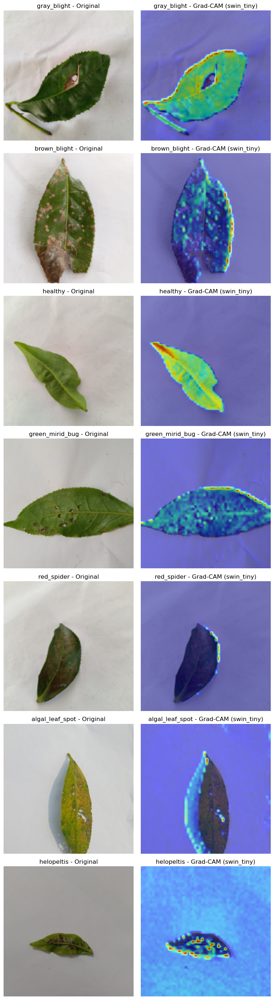

In [56]:
# ---- Grad-CAM (best baseline) ----
def get_generic_target_layer(model):
    """Last nn.Conv2d in the model - a version-independent Grad-CAM target that
    works for pure CNNs, CNN-ViT hybrids (e.g. mobilevit_s, convnext_tiny), and
    even patch-embedding-only ViTs (patch_embed.proj is itself a Conv2d in timm)."""
    last_conv = None
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            last_conv = m
    return last_conv

baseline_target_layers = [get_generic_target_layer(baseline_xai_model)]

fig, axes = plt.subplots(NUM_CLASSES, 2, figsize=(8, 4 * NUM_CLASSES))
class_shown = set()
for i in range(len(test_ds)):
    _, label = test_ds[i]
    if label in class_shown:
        continue
    class_shown.add(label)
    rgb_img, cam_img, lbl = gradcam_on_sample(baseline_xai_model, test_ds, i, baseline_target_layers)
    row = len(class_shown) - 1
    axes[row, 0].imshow(rgb_img); axes[row, 0].set_title(f"{LABEL_LIST[lbl]} - Original"); axes[row, 0].axis("off")
    axes[row, 1].imshow(cam_img); axes[row, 1].set_title(f"{LABEL_LIST[lbl]} - Grad-CAM ({best_baseline_short_name})")
    axes[row, 1].axis("off")
    if len(class_shown) == NUM_CLASSES:
        break

plt.tight_layout()
plt.savefig(f"{XAI_DIR}/gradcam_baseline_{best_baseline_short_name}_all_classes.png", dpi=300, bbox_inches="tight")
plt.show()

100%|██████████| 300/300 [00:02<00:00, 125.75it/s]


  LIME (baseline) done for class: algal_leaf_spot


100%|██████████| 300/300 [00:02<00:00, 130.29it/s]


  LIME (baseline) done for class: brown_blight


100%|██████████| 300/300 [00:02<00:00, 135.22it/s]


  LIME (baseline) done for class: gray_blight


100%|██████████| 300/300 [00:02<00:00, 141.29it/s]


  LIME (baseline) done for class: helopeltis


100%|██████████| 300/300 [00:02<00:00, 135.75it/s]


  LIME (baseline) done for class: red_spider


100%|██████████| 300/300 [00:02<00:00, 136.91it/s]


  LIME (baseline) done for class: green_mirid_bug


100%|██████████| 300/300 [00:02<00:00, 136.54it/s]


  LIME (baseline) done for class: healthy


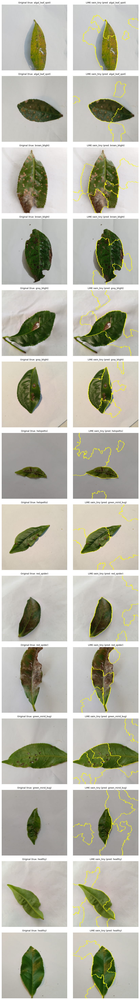

In [57]:
# ---- LIME (best baseline, 2 samples per class) ----
def baseline_predict_fn(images_np):
    batch = []
    for img in images_np:
        img_pil = Image.fromarray(img.astype("uint8"))
        tensor = get_eval_transform()(img_pil)
        batch.append(tensor)
    batch = torch.stack(batch).to(device)
    with torch.no_grad():
        logits = baseline_xai_model(batch)
        probs = F.softmax(logits, dim=1)
    return probs.cpu().numpy()

explainer_baseline = lime_image.LimeImageExplainer()

total_rows = sum(len(v) for v in class_to_indices.values())
fig, axes = plt.subplots(total_rows, 2, figsize=(9, 4.2 * total_rows))
if total_rows == 1:
    axes = axes.reshape(1, 2)

row = 0
for class_idx in range(NUM_CLASSES):
    for sample_idx in class_to_indices[class_idx]:
        img_tensor, label = test_ds[sample_idx]
        rgb_img = (denormalize(img_tensor).permute(1, 2, 0).numpy() * 255).astype("uint8")

        explanation = explainer_baseline.explain_instance(
            rgb_img, baseline_predict_fn, top_labels=1, hide_color=0, num_samples=300
        )
        explained_label = explanation.top_labels[0]
        temp, mask = explanation.get_image_and_mask(
            explained_label, positive_only=True, num_features=8, hide_rest=False
        )

        axes[row, 0].imshow(rgb_img)
        axes[row, 0].set_title(f"Original (true: {LABEL_LIST[label]})", fontsize=9)
        axes[row, 0].axis("off")
        axes[row, 1].imshow(mark_boundaries(temp / 255.0, mask))
        axes[row, 1].set_title(f"LIME {best_baseline_short_name} (pred: {LABEL_LIST[explained_label]})", fontsize=9)
        axes[row, 1].axis("off")
        row += 1
    print(f"  LIME (baseline) done for class: {LABEL_LIST[class_idx]}")

plt.tight_layout()
plt.savefig(f"{XAI_DIR}/lime_baseline_{best_baseline_short_name}_all_classes.png", dpi=300, bbox_inches="tight")
plt.show()

Running SHAP on CPU for 7 images (baseline: swin_tiny), nsamples=30 - this may take several minutes, do not interrupt.
[OK] SHAP (baseline) computed in 146.4s.


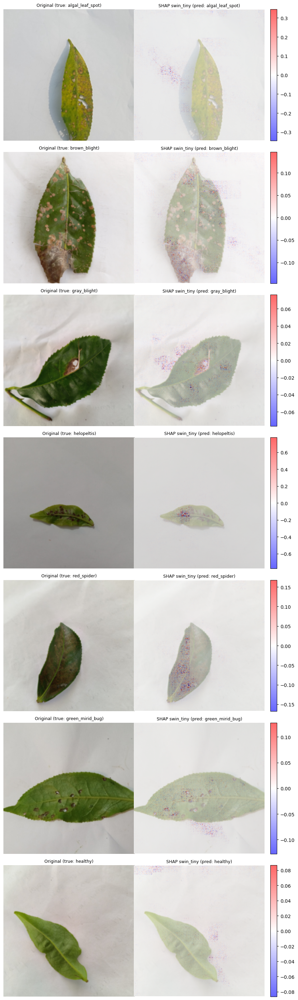

[OK] SHAP visualization (baseline, one per class) saved.


In [58]:
# ---- SHAP (best baseline, one sample per class, CPU, memory-safe) ----
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

shap_baseline_model = copy.deepcopy(baseline_xai_model).to(shap_device).eval()

print(f"Running SHAP on CPU for {test_batch.shape[0]} images (baseline: {best_baseline_short_name}), "
      f"nsamples={SHAP_NSAMPLES} - this may take several minutes, do not interrupt.")

t0 = time.time()
explainer_shap_baseline = shap.GradientExplainer(shap_baseline_model, background_batch)
shap_values_baseline = explainer_shap_baseline.shap_values(test_batch, nsamples=SHAP_NSAMPLES)
print(f"[OK] SHAP (baseline) computed in {time.time()-t0:.1f}s.")

if isinstance(shap_values_baseline, list):
    sv_list_b = [np.transpose(np.array(sv), (0, 2, 3, 1)) for sv in shap_values_baseline]
else:
    sv_b = np.array(shap_values_baseline)
    num_cls_b = sv_b.shape[-1]
    sv_list_b = [np.transpose(sv_b[..., k], (0, 2, 3, 1)) for k in range(num_cls_b)]

with torch.no_grad():
    pred_classes_b = shap_baseline_model(test_batch).argmax(dim=1).cpu().numpy()

n_imgs = test_batch.shape[0]
fig, axes = plt.subplots(n_imgs, 2, figsize=(9, 4.2 * n_imgs))
if n_imgs == 1:
    axes = axes.reshape(1, 2)

for i in range(n_imgs):
    orig = denorm_for_display(test_batch[i])
    pred_c = int(pred_classes_b[i])
    true_c = int(test_true_labels[i])
    shap_map = sv_list_b[pred_c][i].sum(axis=-1)
    limit = np.max(np.abs(shap_map)) + 1e-8

    axes[i, 0].imshow(orig)
    axes[i, 0].set_title(f"Original (true: {LABEL_LIST[true_c]})", fontsize=9)
    axes[i, 0].axis("off")
    axes[i, 1].imshow(orig)
    hm = axes[i, 1].imshow(shap_map, cmap="bwr", alpha=0.6, vmin=-limit, vmax=limit)
    axes[i, 1].set_title(f"SHAP {best_baseline_short_name} (pred: {LABEL_LIST[pred_c]})", fontsize=9)
    axes[i, 1].axis("off")
    fig.colorbar(hm, ax=axes[i, 1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig(f"{XAI_DIR}/shap_baseline_{best_baseline_short_name}_all_classes.png", dpi=300, bbox_inches="tight")
plt.show()

del shap_baseline_model
gc.collect()
print("[OK] SHAP visualization (baseline, one per class) saved.")

Extracted 798 embeddings of dim 7 from swin_tiny
Silhouette score (swin_tiny, higher = better separated classes): 0.1158


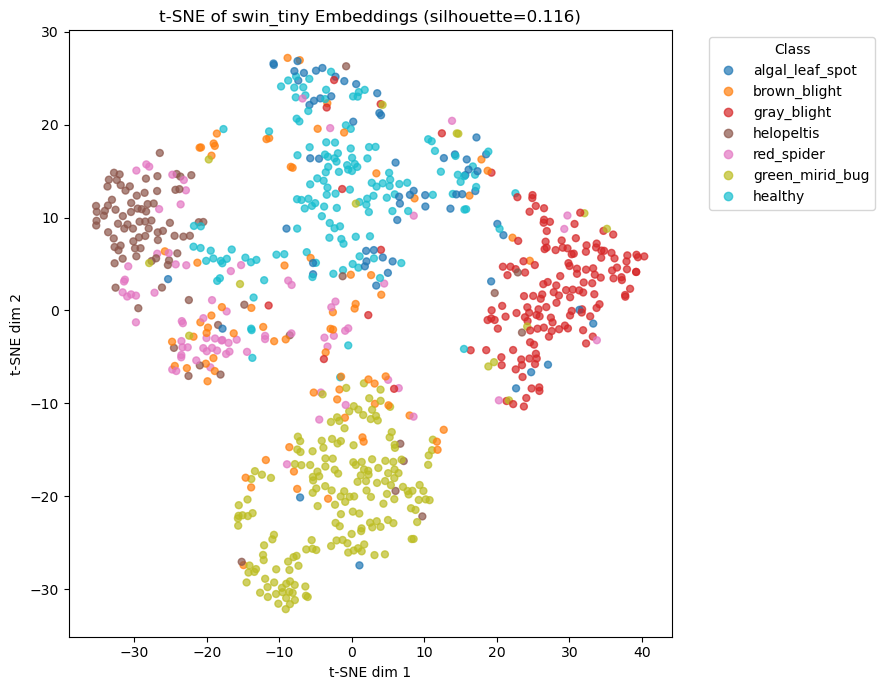

In [59]:
# ---- t-SNE on the best baseline's learned embeddings ----
@torch.no_grad()
def extract_embeddings_generic(model, loader, device):
    """Works for arbitrary timm classifiers: uses forward_features() (pre-head
    representation) and global-average-pools spatial (4D) or token (3D) outputs
    down to a single feature vector per image. Falls back to raw logits if the
    model exposes neither forward_features nor a 4D/3D intermediate."""
    model.eval()
    all_feats, all_labels = [], []
    for images, labels in loader:
        images = images.to(device)
        if hasattr(model, "forward_features"):
            feats = model.forward_features(images)
        else:
            feats = model(images)
        if feats.ndim == 4:            # (B, C, H, W) - CNN-style
            feats = F.adaptive_avg_pool2d(feats, 1).flatten(1)
        elif feats.ndim == 3:          # (B, N, C) - transformer tokens
            feats = feats.mean(dim=1)
        all_feats.append(feats.cpu().numpy())
        all_labels.extend(labels.numpy())
    return np.concatenate(all_feats, axis=0), np.array(all_labels)

baseline_embeddings, baseline_emb_labels = extract_embeddings_generic(baseline_xai_model, test_loader, device)
print(f"Extracted {baseline_embeddings.shape[0]} embeddings of dim {baseline_embeddings.shape[1]} "
      f"from {best_baseline_short_name}")

tsne_baseline = TSNE(n_components=2, random_state=SEED,
                      perplexity=min(30, len(baseline_embeddings) - 1))
baseline_emb_2d = tsne_baseline.fit_transform(baseline_embeddings)

baseline_sil_score = (silhouette_score(baseline_embeddings, baseline_emb_labels)
                       if len(set(baseline_emb_labels)) > 1 else float("nan"))
print(f"Silhouette score ({best_baseline_short_name}, higher = better separated classes): "
      f"{baseline_sil_score:.4f}")

plt.figure(figsize=(9, 7))
scatter = plt.scatter(baseline_emb_2d[:, 0], baseline_emb_2d[:, 1],
                       c=baseline_emb_labels, cmap="tab10", alpha=0.7, s=25)
handles, _ = scatter.legend_elements()
plt.legend(handles, LABEL_LIST, title="Class", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.title(f"t-SNE of {best_baseline_short_name} Embeddings (silhouette={baseline_sil_score:.3f})")
plt.xlabel("t-SNE dim 1"); plt.ylabel("t-SNE dim 2")
plt.tight_layout()
plt.savefig(f"{XAI_DIR}/tsne_baseline_{best_baseline_short_name}_embeddings.png", dpi=300, bbox_inches="tight")
plt.show()

In [60]:
# ---- Print a final checklist of all saved outputs ----
print("\n" + "=" * 80)
print("COMPLETE OUTPUT MANIFEST")
print("=" * 80)

output_dirs = {
    "Figures":           FIGURES_DIR,
    "XAI Visualizations": XAI_DIR,
    "Robustness":        ROBUSTNESS_DIR,
    "Tables (CSV)":      TABLES_DIR,
    "Training History":  HISTORY_DIR,
    "Checkpoints":       CHECKPOINT_DIR,
}

for category, search_dir in output_dirs.items():
    files = sorted(glob.glob(f"{search_dir}/*"))
    # skip .sha256 sidecar files for cleaner display
    files = [f for f in files if not f.endswith(".sha256")]
    if files:
        print(f"\n{category}  ({search_dir}/)")
        print("-" * 70)
        for f in files:
            size_kb = os.path.getsize(f) / 1024
            print(f"  \u2713  {os.path.basename(f):50s} {size_kb:8.1f} KB")

print("\n" + "=" * 80)
print("Directory structure:")
print("  results/")
print("  \u251c\u2500\u2500 figures/        Training curves, confusion matrices, comparisons")
print("  \u251c\u2500\u2500 tables/         CSV files for LaTeX tables")
print("  \u251c\u2500\u2500 history/        Training history JSON files")
print("  \u251c\u2500\u2500 xai/            Grad-CAM, LIME, t-SNE visualizations")
print("  \u2514\u2500\u2500 robustness/     Adversarial + corruption results & plots")
print("  checkpoints/        Model weights (.pt + .sha256)")
print("=" * 80)



COMPLETE OUTPUT MANIFEST

Figures  (./results/figures/)
----------------------------------------------------------------------
  ✓  baseline_convnext_tiny_confusion_matrix.png           214.1 KB
  ✓  baseline_deit_small_confusion_matrix.png              210.8 KB
  ✓  baseline_densenet201_confusion_matrix.png             222.7 KB
  ✓  baseline_efficientnet_b3_confusion_matrix.png         212.9 KB
  ✓  baseline_mambavision_t_confusion_matrix.png           216.3 KB
  ✓  baseline_mobilenetv3_large_confusion_matrix.png       217.5 KB
  ✓  baseline_mobilevit_s_confusion_matrix.png             219.4 KB
  ✓  baseline_resnet50_confusion_matrix.png                214.1 KB
  ✓  baseline_swin_tiny_confusion_matrix.png               208.9 KB
  ✓  baseline_vit_small_confusion_matrix.png               215.1 KB
  ✓  calibration_and_confidence.png                        209.6 KB
  ✓  complete_results_dashboard.png                        716.8 KB
  ✓  per_class_metrics.png                              